In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import math
import seaborn as sns

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


## **COMMENTS**

In [ ]:
file_path = '/content/drive/My Drive/Normalised value based on Absolute max min.xlsx'
df = pd.read_excel(file_path)
df.head()

"file_path = '/content/drive/My Drive/Normalised value based on Absolute max min.xlsx'\ndf = pd.read_excel(file_path)\ndf.head()"

In [ ]:

# Identify inverter columns
cuf_cols = [col for col in df.columns if col.startswith("Inverter") and "CUF" in col]
pr_cols = [col for col in df.columns if col.startswith("Inverter") and "PR" in col]

# Sort to ensure matching CUF/PR for each inverter
cuf_cols.sort()
pr_cols.sort()

# Create 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharex=True, sharey=True)
axes = axes.flatten()

# Plot each inverter's CUF and PR
for i in range(len(cuf_cols)):
    ax = axes[i]
    ax.plot(df[cuf_cols[i]], label='CUF', color='blue')
    ax.plot(df[pr_cols[i]], label='PR', color='orange')
    ax.set_title(cuf_cols[i].replace(" CUF", ""))
    ax.set_ylim(0, 1)
    ax.legend(loc='upper right', fontsize='small')

# Hide unused axes if fewer than 16 inverters
for j in range(len(cuf_cols), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

'\n# Identify inverter columns\ncuf_cols = [col for col in df.columns if col.startswith("Inverter") and "CUF" in col]\npr_cols = [col for col in df.columns if col.startswith("Inverter") and "PR" in col]\n\n# Sort to ensure matching CUF/PR for each inverter\ncuf_cols.sort()\npr_cols.sort()\n\n# Create 4x4 grid of subplots\nfig, axes = plt.subplots(4, 4, figsize=(16, 12), sharex=True, sharey=True)\naxes = axes.flatten()\n\n# Plot each inverter\'s CUF and PR\nfor i in range(len(cuf_cols)):\n    ax = axes[i]\n    ax.plot(df[cuf_cols[i]], label=\'CUF\', color=\'blue\')\n    ax.plot(df[pr_cols[i]], label=\'PR\', color=\'orange\')\n    ax.set_title(cuf_cols[i].replace(" CUF", ""))\n    ax.set_ylim(0, 1)\n    ax.legend(loc=\'upper right\', fontsize=\'small\')\n\n# Hide unused axes if fewer than 16 inverters\nfor j in range(len(cuf_cols), len(axes)):\n    axes[j].axis(\'off\')\n\nplt.tight_layout()\nplt.show() '

In [ ]:
def plot_pr_cuf_for_date_range(combined_df, start_date=None, end_date=None):
    """
    Filters combined_df for the given date range and calls plot_all_inverter_pr_cuf_by_year.

    Args:
        combined_df (pd.DataFrame): Data with 'Date' and inverter PR/CUF columns.
        start_date (str or pd.Timestamp, optional): Start date (inclusive).
        end_date (str or pd.Timestamp, optional): End date (inclusive).
    """
    if 'Date' not in combined_df.columns:
        raise ValueError("DataFrame must contain a 'Date' column.")

    df_filtered = combined_df.copy()
    df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

    if start_date:
        start_date = pd.to_datetime(start_date)
        df_filtered = df_filtered[df_filtered['Date'] >= start_date]

    if end_date:
        end_date = pd.to_datetime(end_date)
        df_filtered = df_filtered[df_filtered['Date'] <= end_date]

    if df_filtered.empty:
        print(f"No data available between {start_date} and {end_date}.")
        return

    plot_all_inverter_pr_cuf_by_year(df_filtered)
plot_all_inverter_pr_cuf_by_year(df_filtered)

# **STAR WIRE EXT**

In [2]:
import os
import glob
folder_path = '/Users/ayush/Documents/GitHub/PR_CUF/fp/logs'
excel_files = glob.glob(os.path.join(folder_path, "*.xlsx"))

print(f"Found {len(excel_files)} Excel files.")

Found 1 Excel files.


In [3]:
import re

def combiner(file_list, output_path="combined_inverter_data.xlsx"):
    file_list = [fp for fp in file_list if os.path.basename(fp).startswith("Log Book")]
    combined = pd.DataFrame()   # start empty
    cols_to_drop = ['S.No','Plant','Capacity','Opex/Capex','Zone','Investor','Building']

    for fp in file_list:
        try:
            df = pd.read_excel(fp, sheet_name='My Sheet')
            df = df.drop(columns=[c for c in cols_to_drop if c in df.columns])

            date_cols = [c for c in df.columns
                         if isinstance(c, str)
                         and re.match(r'\d{1,2}-[A-Za-z]{3}-\d{4}', c)]

            sheet_t = (
                df.set_index('Parameter/Device')[date_cols]
                  .T
                  .reset_index()
                  .rename(columns={'index': 'Date'})
            )
            sheet_t['Date'] = pd.to_datetime(sheet_t['Date'],
                                              format='%d-%b-%Y',
                                              dayfirst=True,
                                              errors='coerce')
            sheet_t = sheet_t.sort_values('Date').reset_index(drop=True)

            # <-- use pd.concat, not .append
            combined = pd.concat([combined, sheet_t], ignore_index=True)
            print(f"✔ Processed: {os.path.basename(fp)}")

        except Exception as e:
            print(f"❌ Failed: {os.path.basename(fp)} — {e}")
    # Sort all data and add a continuous DayIndex
    combined = combined.sort_values('Date').reset_index(drop=True)
    unique_dates = combined['Date'].drop_duplicates().tolist()
    date_to_index = {d: i+1 for i, d in enumerate(unique_dates)}
    combined['DayIndex'] = combined['Date'].map(date_to_index)

    combined.to_excel(output_path, index=False)
    print(f"\n✅ Combined data saved to: {output_path}")
    return combined

In [4]:
# 4️⃣ Run the combiner
combined_df = combiner(excel_files)

✔ Processed: Log Book - Star Wire Chhainsa Extension - 2025-07-01 to 2025-10-01.xlsx

✅ Combined data saved to: combined_inverter_data.xlsx


In [ ]:
# from google.colab import files
# #files.download("combined_inverter_data.xlsx")

In [5]:
import os
import pandas as pd
import re

def add_cuf_pr_from_specs(combined_df, folder_path, specs_filename,
                          area_per_panel, panel_rating_kW,
                          verbose=True, panel_efficiency=0.2):
    """
    Adds CUF and PR columns for each inverter based on inverter specs and POA energy.

    Parameters:
        combined_df (pd.DataFrame): DataFrame with energy data and 'POA Energy' column.
        folder_path (str): Directory containing inverter specs Excel file.
        specs_filename (str): File name of inverter specs.
        area_per_panel (float): Panel area in m².
        panel_rating_kW (float): Power rating of one panel in kW.
        verbose (bool): Print debug info.
        panel_efficiency (float): Panel efficiency (e.g., 0.2 for 20%).

    Returns:
        pd.DataFrame: Updated DataFrame with CUF and PR columns.
    """

    # --- Step 1: Load specs
    specs_path = os.path.join(folder_path, specs_filename)
    inv_df = pd.read_excel(specs_path)

    inverter_specs = {}
    for _, row in inv_df.iterrows():
        try:
            inv_num = int(row["Inverter"])
            spec_key = f"Inverter {inv_num}"
            inverter_specs[spec_key] = {
                "AC": float(row["AC"]),
                "DC": float(row["DC"])
            }
        except Exception as e:
            if verbose:
                print(f"⚠️ Skipping invalid spec row: {e}")
            continue

    # --- Step 2: Filter POA Energy = 0
    poa_zero_rows = combined_df[combined_df["POA Energy"] == 0].copy()
    combined_df = combined_df[combined_df["POA Energy"] != 0].copy()

    if verbose and not poa_zero_rows.empty:
        print("⚠️ Rows with POA Energy = 0 (excluded):")
        display(poa_zero_rows)

    # --- Step 3: Match inverter columns like 'Inverter-1', 'INV 1', etc.
    inv_col_map = {}
    for col in combined_df.columns:
        match = re.match(r"(inverter|inv)[\s\-_]?(\d+)$", col.strip(), re.IGNORECASE)
        if match:
            inv_num = int(match.group(2))
            spec_key = f"Inverter {inv_num}"
            if spec_key in inverter_specs:
                inv_col_map[col] = spec_key
            elif verbose:
                print(f"⚠️ Column '{col}' matched as '{spec_key}' but no spec found.")

    # --- Step 4: Compute CUF and PR
    for raw_col, spec_key in inv_col_map.items():
        ac_kW = inverter_specs[spec_key]["AC"]
        dc_kW = inverter_specs[spec_key]["DC"]

        combined_df[raw_col] = pd.to_numeric(combined_df[raw_col], errors="coerce")

        # CUF = output / (AC × 24) × 100
        combined_df[f"{spec_key} CUF"] = (
            combined_df[raw_col] / (ac_kW * 24)
        ) * 100

        # PR = output / (POA × area × efficiency) × 100
        num_panels = dc_kW / panel_rating_kW
        total_area = num_panels * area_per_panel

        valid = combined_df["POA Energy"] > 0
        pr_col = f"{spec_key} PR"
        combined_df[pr_col] = pd.NA
        combined_df.loc[valid, pr_col] = (
            combined_df.loc[valid, raw_col] /
            (combined_df.loc[valid, "POA Energy"] * total_area * panel_efficiency)
        ) * 100

    return combined_df

In [7]:
# area of panel=1722x1134=1.952748m^2 and efficiency: 23.04 rating:450Wp
combined_df = add_cuf_pr_from_specs(combined_df, folder_path,'combined_inverter_data.xlsx',1.952748,0.45,False,0.2304)

In [8]:
output_path = folder_path + "/combined_with_PR_CUF.xlsx"
combined_df.to_excel(output_path, index=True)
#files.download(output_path)

In [9]:
def plot_inverter_cuf_pr(combined_df):
    """
    Plots CUF and PR for each inverter in a twin‑axis grid layout.

    Parameters:
    - combined_df: pandas DataFrame containing:
        * A 'Date' column of datetime values.
        * For each inverter:
            - '<Inverter Name> CUF' column (percentage).
            - '<Inverter Name> PR' column (percentage).
    """
    # Detect inverters based on CUF column names
    cuf_cols = [col for col in combined_df.columns if col.endswith(' CUF')]
    inverters = [col[:-4] for col in cuf_cols]  # strip off the " CUF" suffix

    # Compute a nearly square grid
    n = len(inverters)
    ncols = math.ceil(math.sqrt(n))
    nrows = math.ceil(n / ncols)

    # Create subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 3))
    axes = axes.flatten()

    for idx, inv in enumerate(inverters):
        ax1 = axes[idx]
        ax2 = ax1.twinx()

        # Column names
        cuf_col = f"{inv} CUF"
        pr_col  = f"{inv} PR"

        # CUF plot on primary y-axis (blue)
        ax1.plot(combined_df['Date'], combined_df[cuf_col], color='tab:blue', label='CUF')
        ax1.set_ylabel('CUF (%)', color='tab:blue')
        ax1.tick_params(axis='y', labelcolor='tab:blue')

        # PR plot on secondary y-axis (orange)
        ax2.plot(combined_df['Date'], combined_df[pr_col], color='tab:orange', label='PR', linestyle='--')
        ax2.set_ylabel('PR (%)', color='tab:orange')
        ax2.tick_params(axis='y', labelcolor='tab:orange')

        ax1.set_title(inv)
        ax1.set_xlabel('Date')

    # Hide any unused subplots
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout()
    plt.show()

In [10]:
def plot_all_inverter_pr_cuf(combined_df):
    """
    Plots PR and CUF over time for all inverters.
    Each inverter gets a unique color and the same marker for visibility.
    """

    # --- PR Plot ---
    pr_cols = [col for col in combined_df.columns if col.endswith(' PR')]
    pr_inverters = [col.replace(' PR', '') for col in pr_cols]
    num_pr = len(pr_cols)

    color_map = cm.get_cmap('tab20', num_pr)
    colors = [color_map(i) for i in range(num_pr)]

    plt.figure(figsize=(14, 6))
    for i, col in enumerate(pr_cols):
        plt.plot(
            combined_df['Date'],
            combined_df[col],
            label=pr_inverters[i],
            color=colors[i],
            marker='o',
            markersize=3,
            linewidth=1
        )

    plt.title("PR vs Date for All Inverters")
    plt.xlabel("Date")
    plt.ylabel("Performance Ratio (%)")
    plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.15),  # Adjusts position below plot
    ncol=4,                        # Number of columns in legend
    fontsize='small'
    )
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- CUF Plot ---
    cuf_cols = [col for col in combined_df.columns if col.endswith(' CUF')]
    cuf_inverters = [col.replace(' CUF', '') for col in cuf_cols]
    num_cuf = len(cuf_cols)

    color_map = cm.get_cmap('tab20', num_cuf)
    colors = [color_map(i) for i in range(num_cuf)]

    plt.figure(figsize=(14, 6))
    for i, col in enumerate(cuf_cols):
        plt.plot(
            combined_df['Date'],
            combined_df[col],
            label=cuf_inverters[i],
            color=colors[i],
            marker='o',
            markersize=3,
            linewidth=1
        )

    plt.title("CUF vs Date for All Inverters")
    plt.xlabel("Date")
    plt.ylabel("CUF (%)")
    plt.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.15),  # Adjusts position below plot
    ncol=4,                        # Number of columns in legend
    fontsize='small'
    )
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [11]:
def split_and_display_pr_errors(combined_df, verbose=True):
    """
    Identifies and separates rows where any inverter PR exceeds 100%.

    Args:
        combined_df (pd.DataFrame): DataFrame with PR columns (ending in ' PR').
        verbose (bool): Whether to display the error rows.

    Returns:
        tuple:
            - df_pr_ok (pd.DataFrame): Rows where all PR values are ≤ 100%.
            - df_pr_error (pd.DataFrame): Rows with at least one PR value > 100%.
    """
    # Identify all PR columns
    pr_cols = [col for col in combined_df.columns if col.endswith(' PR')]

    # Create mask where any PR > 100
    pr_above_100_mask = combined_df[pr_cols].gt(100).any(axis=1)

    # Split the DataFrame
    df_pr_error = combined_df[pr_above_100_mask].copy()
    df_pr_ok = combined_df[~pr_above_100_mask].copy()

    # Display error rows if needed
    if verbose and not df_pr_error.empty:
        print("⚠️ Rows with PR > 100% detected:")
        display(df_pr_error)

    return df_pr_ok, df_pr_error

In [ ]:
df_pr_ok, df_pr_error = split_and_display_pr_errors(combined_df)

⚠️ Rows with PR > 100% detected:


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter-01,Inverter-02,...,Inverter 13 CUF,Inverter 13 PR,Inverter 14 CUF,Inverter 14 PR,Inverter 15 CUF,Inverter 15 PR,Inverter 16 CUF,Inverter 16 PR,Inverter 17 CUF,Inverter 17 PR
5,2025-01-06,23.52,1.46,74.42,1.96,1.97,2964.6,3876.2,334.1,342.5,...,3.484848,32.953559,8.479167,76.923389,8.150000,73.937174,6.446970,67.016589,9.008333,76.616263
19,2025-01-20,12.77,2.54,76.37,3.33,3.34,5147.5,5901,663.0,665.0,...,8.207071,45.679195,14.500000,77.425689,13.904167,74.244116,10.856061,66.421823,15.812500,79.156921
20,2025-01-21,21.94,2.07,60.25,3.44,3.45,4183.9,5360.1,344.5,346.2,...,7.474747,40.27287,18.508333,95.668768,17.583333,90.887483,17.583333,104.141908,19.970833,96.776594
33,2025-02-03,35.59,2.6,72.02,3.61,3.61,5264,8172.7,690.8,703.6,...,6.010101,30.856671,15.987500,78.747118,13.737500,67.664646,12.128788,68.453075,14.333333,66.186983
110,2025-04-21,7.58,4.43,75,5.91,5.91,8973.1,9709.5,1058.0,1065.0,...,15.366162,48.1895,24.729167,74.401778,23.937500,72.019918,21.901515,75.50391,24.629167,69.469604
127,2025-05-08,22.16,3.02,56.56,5.34,5.35,6110.9,7850.2,828.0,835.9,...,16.868687,58.548331,21.633333,72.034989,20.791667,69.232395,20.666667,78.85186,22.125000,69.067639


/tmp/ipython-input-99-3056825185.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_pr)


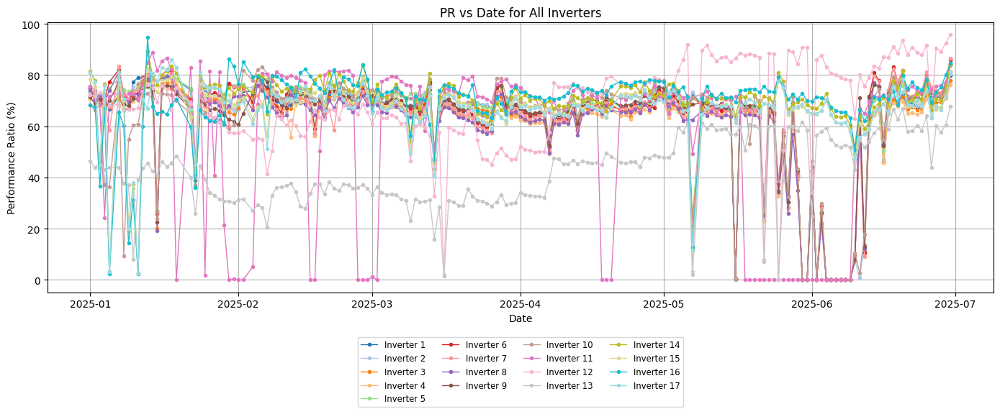

/tmp/ipython-input-99-3056825185.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_cuf)


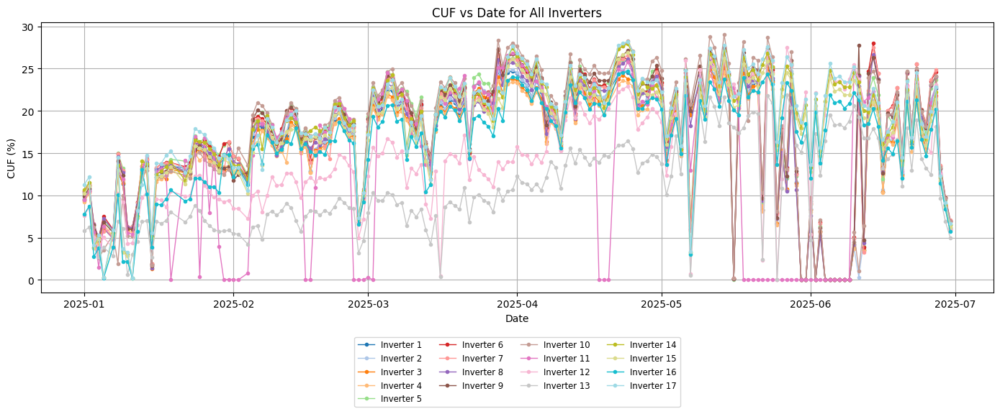

In [ ]:
plot_all_inverter_pr_cuf(df_pr_ok)

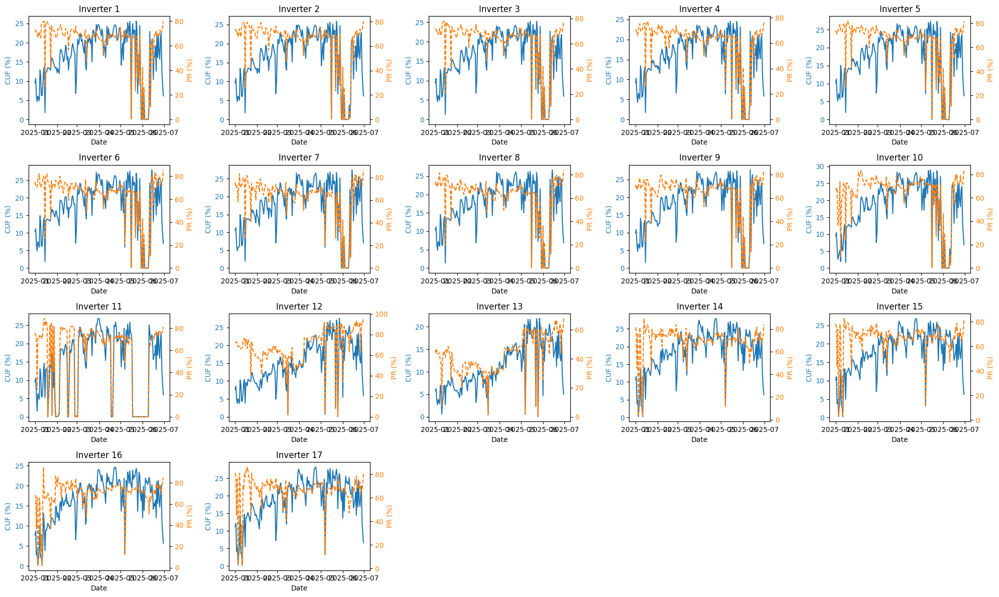

In [ ]:
plot_inverter_cuf_pr(df_pr_ok)

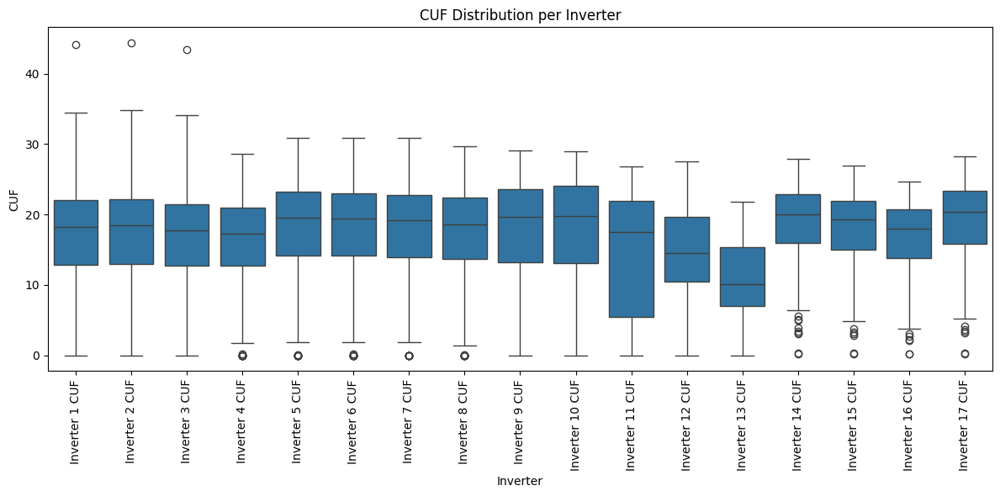

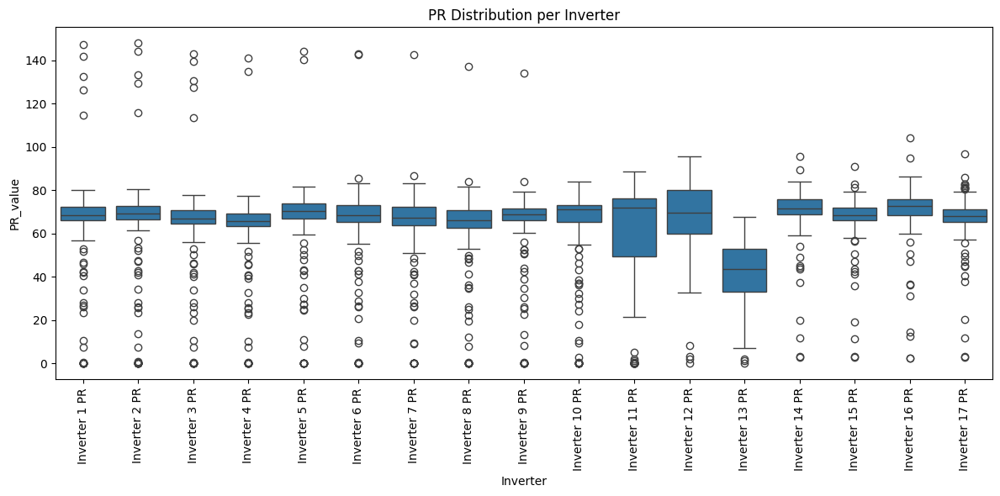

In [ ]:
def plot_pr_cuf_distributions(combined_df):
    """
    Plots boxplots for CUF and PR values per inverter from a given combined DataFrame.

    Args:
        combined_df (pd.DataFrame): A DataFrame that includes 'Date' and inverter-wise
                                    columns ending with ' CUF' and ' PR'.
    """
    # Identify CUF and PR columns
    pr_cols = [col for col in combined_df.columns if col.endswith(' PR')]
    cuf_cols = [col for col in combined_df.columns if col.endswith(' CUF')]

    # Melt CUF data for plotting
    cuf_melted = combined_df.melt(id_vars=['Date'], value_vars=cuf_cols,
                                  var_name='Inverter', value_name='CUF')

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=cuf_melted, x='Inverter', y='CUF')
    plt.xticks(rotation=90)
    plt.title("CUF Distribution per Inverter")
    plt.tight_layout()
    plt.show()

    # Melt PR data for plotting
    pr_melted = combined_df.melt(id_vars=['Date'], value_vars=pr_cols,
                                 var_name='Inverter', value_name='PR_value')

    plt.figure(figsize=(12, 6))
    sns.boxplot(data=pr_melted, x='Inverter', y='PR_value')
    plt.xticks(rotation=90)
    plt.title("PR Distribution per Inverter")
    plt.tight_layout()
    plt.show()
plot_pr_cuf_distributions(combined_df)

In [ ]:
def identify_cleaning_events(df, pr_jump_low: float = 2, pr_jump_med: float = 5, pr_drop_before: float = 5 ):
    """
    Identify cleaning event dates based on PR jumps in inverter columns.

    Parameters:
    - df: Input DataFrame with a 'Date' column and PR columns ending with ' PR'.
    - pr_jump_low: Threshold for low PR jump (%).
    - pr_jump_med: Threshold for medium PR jump (%).
    - pr_drop_before: Threshold for flagging downtime if previous day drop > this value (%).

    Returns:
    - summary_df: DataFrame summarizing cleaning events and downtime flags.
    """

    # Automatically detect PR columns ending with ' PR'
    pr_cols = [col for col in df.columns if col.endswith(' PR')]

    # Calculate PR deltas if not already calculated
    for col in pr_cols:
        df[f'{col}_delta'] = df[col].diff()

    # Calculate previous day delta to check for downtime drop
    for col in pr_cols:
        df[f'{col}_delta_prev'] = df[col].diff().shift(1)

    # Prepare delta DataFrame for calculations
    delta_cols = [f'{col}_delta' for col in pr_cols] + [f'{col}_delta_prev' for col in pr_cols]
    delta_df = df[['Date'] + delta_cols].copy()

    num_inverters = len(pr_cols)
    delta_df['PR_jump_above_low'] = delta_df[[f'{col}_delta' for col in pr_cols]].gt(pr_jump_low).sum(axis=1)

    # Candidate cleaning dates: at least half inverters show PR jump > pr_jump_low
    cleaning_dates = delta_df[delta_df['PR_jump_above_low'] >= num_inverters // 2]['Date'].tolist()

    print("📅 Candidate cleaning dates:", [d.strftime('%Y-%m-%d') for d in cleaning_dates])

    summary_rows = []
    for date in cleaning_dates:
        row = delta_df[delta_df['Date'] == date]
        if row.empty:
            continue

        low_jump = []
        med_jump = []
        high_jump = []
        downtime_flag = False

        for col in pr_cols:
            val = row[f'{col}_delta'].values[0]
            prev_val = row[f'{col}_delta_prev'].values[0]

            if pd.isna(val) or pd.isna(prev_val):
                continue

            # Extract inverter number only (digits)
            inverter_num = ''.join(filter(str.isdigit, col))

            if prev_val < -pr_drop_before:  # PR dropped previous day => downtime
                downtime_flag = True

            if val < pr_jump_low:
                low_jump.append(inverter_num)
            elif pr_jump_low <= val < pr_jump_med:
                med_jump.append(inverter_num)
            else:
                high_jump.append(inverter_num)

        summary_rows.append({
            'Date': date.strftime("%Y-%m-%d"),
            'PR Jump <5%': ', '.join(low_jump) if low_jump else '-',
            'PR Jump 5-10%': ', '.join(med_jump) if med_jump else '-',
            'PR Jump >10%': ', '.join(high_jump) if high_jump else '-',
            'Total Inverters': num_inverters,
            'Likely Downtime': 'Yes' if downtime_flag else 'No'
        })

    summary_df = pd.DataFrame(summary_rows)

    # Remove the delta columns from the original DataFrame to clean up
    df.drop(columns=delta_cols, inplace=True)

    print("\n📊 Cleaning Event PR Jump Summary (with Downtime Flag):")
    display(summary_df)

    return summary_df

In [ ]:
summary_df=identify_cleaning_events(combined_df)
summary_df.to_excel('starwire.xlsx', index=False)
#files.download("starwire.xlsx")

📅 Candidate cleaning dates: ['2025-05-03', '2025-05-08', '2025-05-17', '2025-05-23', '2025-05-26', '2025-05-28', '2025-06-01', '2025-06-03', '2025-06-10', '2025-06-11', '2025-06-13', '2025-06-14', '2025-06-17', '2025-06-18', '2025-06-20', '2025-06-25', '2025-06-29', '2025-06-30']

📊 Cleaning Event PR Jump Summary (with Downtime Flag):


,Date,PR Jump <5%,PR Jump 5-10%,PR Jump >10%,Total Inverters,Likely Downtime
0,2025-05-03,"6, 8, 13, 14, 15, 17","1, 2, 3, 4, 5, 7, 9, 10, 12, 16",11,17,Yes
1,2025-05-08,"8, 9, 10",-,"1, 2, 3, 4, 5, 6, 7, 11, 12, 13, 14, 15, 16, 17",17,Yes
2,2025-05-17,"11, 12","7, 13, 16","1, 2, 3, 4, 5, 6, 8, 9, 10, 14, 15, 17",17,Yes
3,2025-05-23,"11, 14, 15, 16, 17",-,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13",17,Yes
4,2025-05-26,"11, 14, 15, 16, 17",-,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13",17,Yes
5,2025-05-28,"11, 12, 13","14, 15, 16, 17","1, 2, 3, 4, 5, 6, 7, 8, 9, 10",17,Yes
6,2025-06-01,"11, 12, 13, 14, 15, 16, 17",-,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10",17,No
7,2025-06-03,"11, 12, 13, 14, 15, 16, 17",-,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10",17,Yes
8,2025-06-10,"12, 13, 14, 15, 16, 17",-,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11",17,No
9,2025-06-11,"2, 10",-,"1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16...",17,Yes


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(combined_df['PR'].dropna(), model='additive', period=30)
result.plot()

# **NER**

In [ ]:
# Path to your folder
folder_path_2= '/content/drive/My Drive/FPE Data/LOG BOOKS/NER/'
excel_files_2 = glob.glob(os.path.join(folder_path_2, "*.xlsx"))

print(f"Found {len(excel_files_2)} Excel files.")

Found 12 Excel files.


In [ ]:
combined_df_2 = combiner(excel_files_2)

✔ Processed: Log Book - North Eastern Railway Gorakhpur - Sat Feb 01 2025.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Sat Mar 01 2025.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Tue Apr 01 2025.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Wed Jan 01 2025.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Thu May 01 2025.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Sun Dec 01 2024.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Fri Nov 01 2024.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Tue Oct 01 2024.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Sun Sep 01 2024.xlsx
✔ Processed: Log Book - North Eastern Railway Gorakhpur - Sun Jun 01 2025.xlsx

✅ Combined data saved to: combined_inverter_data.xlsx


In [ ]:
from google.colab import files
#files.download("combined_inverter_data.xlsx")

In [ ]:
# panel rating is 320Wp and Area is 1.956*0.992=1.940352m^2
combined_df_2 = add_cuf_pr_from_specs(combined_df_2, folder_path_2,'Inverter_Data_NER.xlsx',1.940352,0.32,True,panel_efficiency=0.165)

In [ ]:
output_path_2 = folder_path_2 + "combined_with_PR_CUF.xlsx"
combined_df_2.to_excel(output_path_2, index=False)
#files.download(output_path_2)

In [ ]:
df_pr_ok_2, df_pr_error_2 = split_and_display_pr_errors(combined_df_2)

⚠️ Rows with PR > 100% detected:


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter 1,Inverter 2,...,Inverter 8 CUF,Inverter 8 PR,Inverter 9 CUF,Inverter 9 PR,Inverter 12 CUF,Inverter 12 PR,Inverter 13 CUF,Inverter 13 PR,Inverter 14 CUF,Inverter 14 PR
154,2025-02-02,0.89,1.99,46.72,4.26,3.77,996.7,1005.7,92.4,74.7,...,16.700000,97.793316,16.433333,96.231746,2.083333,11.576935,2.146465,11.927751,1.133333,8.397137
155,2025-02-03,0.79,3.29,77.86,4.23,3.74,1643.4,1656.5,92.5,75.1,...,16.866667,99.469788,16.400000,96.71766,11.426768,63.948072,11.489899,64.301376,6.816667,50.864508


/tmp/ipython-input-12-3056825185.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_pr)


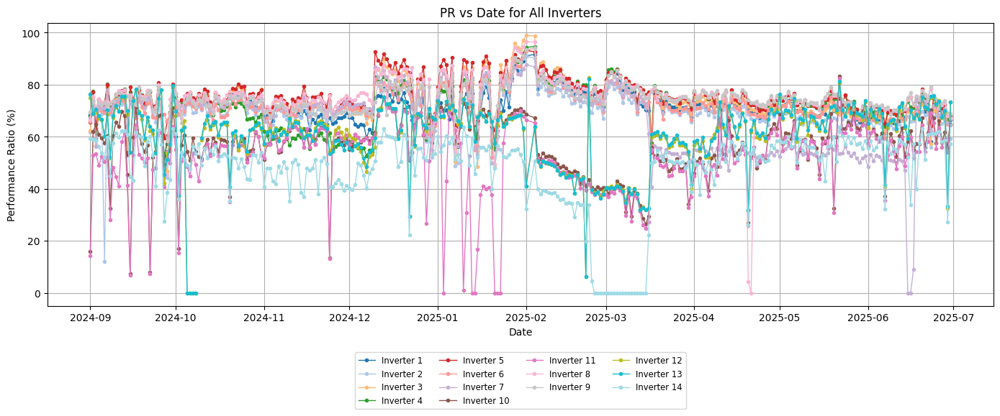

/tmp/ipython-input-12-3056825185.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_cuf)


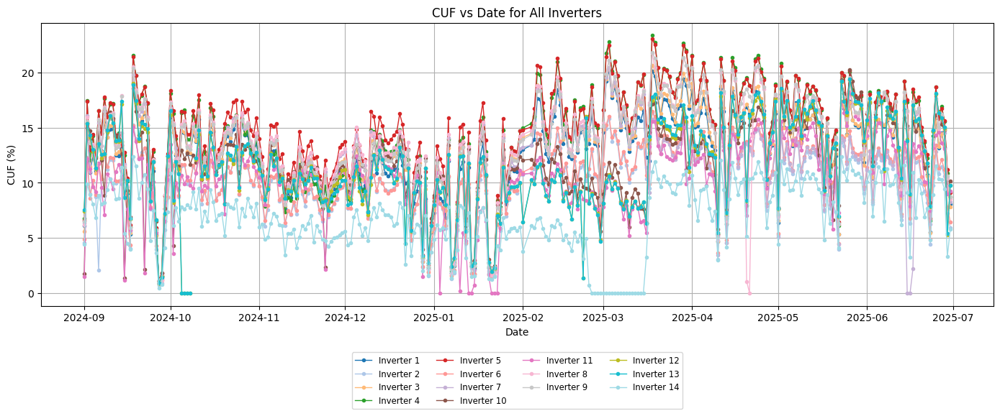

In [ ]:
plot_all_inverter_pr_cuf(df_pr_ok_2)

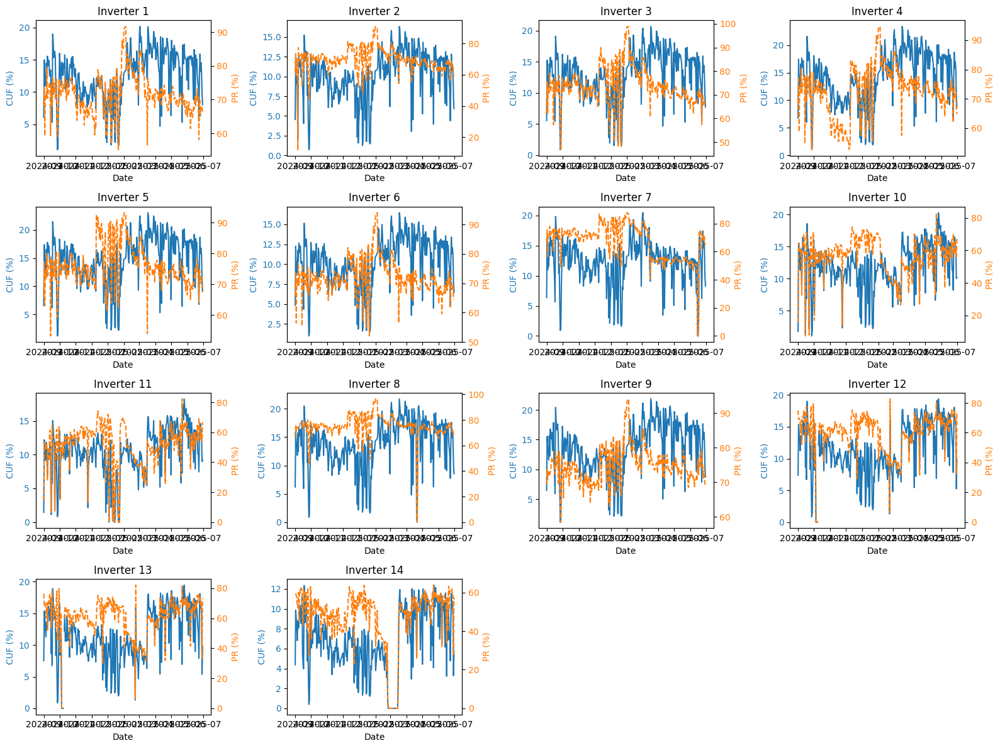

In [ ]:
plot_inverter_cuf_pr(df_pr_ok_2)

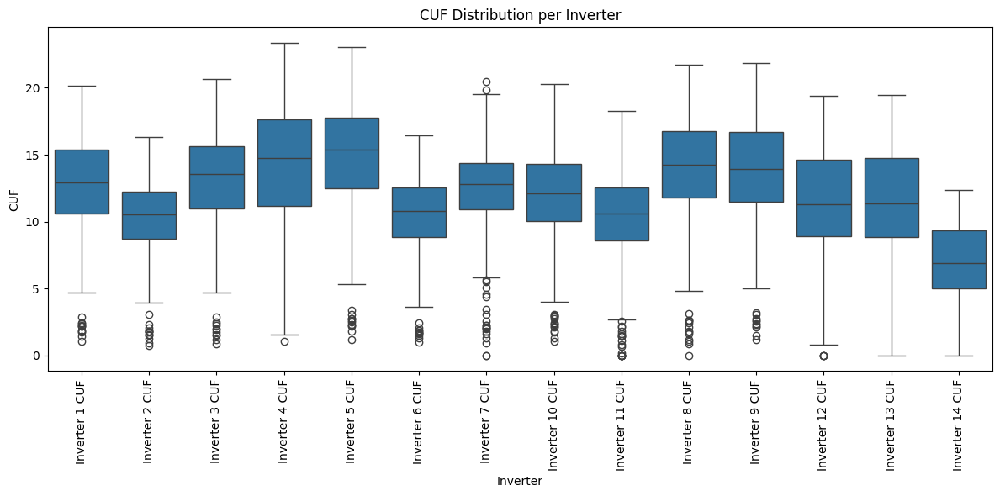

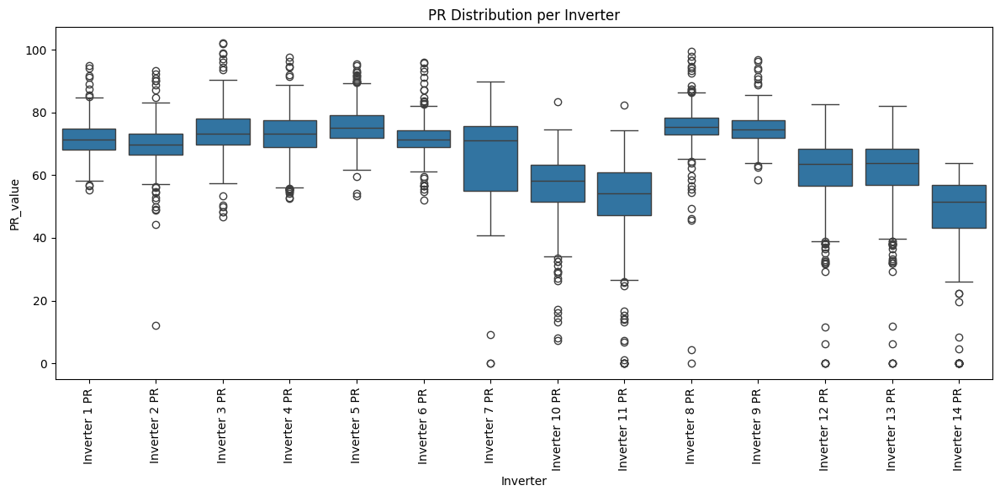

In [ ]:
plot_pr_cuf_distributions(combined_df_2)

In [ ]:
summary_df_2=identify_cleaning_events(combined_df_2)
summary_df_2.to_excel('ner.xlsx', index=False)
# files.download("ner.xlsx")

📅 Candidate cleaning dates: ['2024-09-02', '2024-09-04', '2024-09-07', '2024-09-10', '2024-09-15', '2024-09-18', '2024-09-21', '2024-09-25', '2024-09-28', '2024-09-29', '2024-09-30', '2024-10-05', '2024-10-09', '2024-10-11', '2024-10-15', '2024-10-20', '2024-10-27', '2024-11-04', '2024-11-05', '2024-11-11', '2024-11-15', '2024-11-18', '2024-11-24', '2024-12-08', '2024-12-10', '2024-12-13', '2024-12-19', '2024-12-20', '2024-12-23', '2024-12-25', '2024-12-27', '2024-12-29', '2024-12-31', '2025-01-01', '2025-01-02', '2025-01-06', '2025-01-09', '2025-01-10', '2025-01-13', '2025-01-16', '2025-01-17', '2025-01-22', '2025-01-23', '2025-01-25', '2025-01-27', '2025-01-28', '2025-01-31', '2025-02-06', '2025-02-19', '2025-02-25', '2025-03-01', '2025-03-02', '2025-03-08', '2025-03-13', '2025-03-17', '2025-03-18', '2025-03-22', '2025-04-01', '2025-04-04', '2025-04-09', '2025-04-11', '2025-04-14', '2025-04-18', '2025-04-27', '2025-04-28', '2025-05-19', '2025-05-24', '2025-06-02', '2025-06-08', '2025

,Date,PR Jump <5%,PR Jump 5-10%,PR Jump >10%,Total Inverters,Likely Downtime
0,2024-09-02,-,-,-,14,No
1,2024-09-04,"10, 11, 12, 13, 14","8, 9","1, 2, 3, 4, 5, 6, 7",14,Yes
2,2024-09-07,"11, 8, 9",10,"1, 2, 3, 4, 5, 6, 7, 12, 13, 14",14,Yes
3,2024-09-10,"1, 7, 11","2, 3, 4, 5, 6, 8, 9, 12, 13, 14",10,14,No
4,2024-09-15,"10, 11, 8, 9, 12, 13, 14",-,"1, 2, 3, 4, 5, 6, 7",14,Yes
...,...,...,...,...,...,...
69,2025-06-12,"1, 2, 3, 4, 7, 8, 9","5, 6, 14","10, 11, 12, 13",14,Yes
70,2025-06-15,"7, 12, 13, 14","1, 2, 3, 4, 5, 6, 11, 8, 9",10,14,Yes
71,2025-06-18,"12, 13, 14","1, 2, 3, 4, 5, 6, 10, 11, 8, 9",7,14,Yes
72,2025-06-20,-,"1, 2, 3, 4, 5, 6, 7, 8, 9","10, 11, 12, 13, 14",14,No


# **DMART DOMBIVALI**

In [ ]:
# Path to your folder
folder_path_3= '/content/drive/My Drive/FPE Data/LOG BOOKS/DMART DOMBIVALI/'
excel_files_3 = glob.glob(os.path.join(folder_path_3, "*.xlsx"))
print(f"Found {len(excel_files_3)} Excel files.")

Found 41 Excel files.


In [ ]:
# 4️⃣ Run the combiner
combined_df_3 = combiner(excel_files_3)

✔ Processed: Log Book - D Mart (Dombivali) - Sun Jun 01 2025.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Thu May 01 2025.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Tue Apr 01 2025.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Sat Mar 01 2025.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Sat Feb 01 2025.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Wed Jan 01 2025.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Sun Dec 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Fri Nov 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Tue Oct 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Sun Sep 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Thu Aug 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Mon Jul 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Sat Jun 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Wed May 01 2024.xlsx
✔ Processed: Log Book - D Mart (Dombivali) - Mon Apr 01 2024.xlsx
✔ Processe

In [ ]:
# FOR DOMBIVALI area of panel= 2.274x1.134=2.578716m^2 and efficiency: 20.94 rating:540Wp
combined_df_3 = add_cuf_pr_from_specs(combined_df_3, folder_path_3,'Inverter_Data_DMART_DOMBIVALI.xlsx',2.578716,0.54,True,0.2094)

⚠️ Rows with POA Energy = 0 (excluded):


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter-1,Inverter-2,...,Inverter-4,Inverter-5,Inverter-6,Inverter-7,Meter 1,Meter 2,DG Run Time,CUF (%),AC Yield,DayIndex
0,2022-04-01,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,1
1,2022-04-02,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,2
2,2022-04-03,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,3
3,2022-04-04,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,4
4,2022-04-05,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,5
5,2022-04-06,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,6
6,2022-04-07,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,7
7,2022-04-08,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,8
8,2022-04-09,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,9
9,2022-04-10,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,00:00:00,0,0,10


In [ ]:
output_path_3 = folder_path_3 + "/combined_with_PR_CUF.xlsx"
combined_df_3.to_excel(output_path_3, index=False)

In [ ]:
def plot_inverter_cuf_pr_by_year(combined_df):
    """
    Plots CUF and PR for each inverter, broken down by year.
    Each row corresponds to an inverter, and each column to a year.

    Args:
        combined_df (pd.DataFrame): Must include a 'Date' column and
            "<Inverter X> CUF" / "<Inverter X> PR" columns.
    """
    # Make sure 'Date' is datetime
    combined_df['Date'] = pd.to_datetime(combined_df['Date'])

    # Extract all inverter base names
    cuf_cols = [col for col in combined_df.columns if col.endswith(" CUF")]
    inverters = [col.replace(" CUF", "") for col in cuf_cols]

    # Extract unique years
    combined_df["Year"] = combined_df["Date"].dt.year
    years = sorted(combined_df["Year"].unique())

    nrows = len(inverters)
    ncols = len(years)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 4, nrows * 3), sharex='col')
    if nrows == 1:
        axes = [axes]  # ensure 2D shape
    if ncols == 1:
        axes = [[ax] for ax in axes]  # ensure 2D shape

    for i, inverter in enumerate(inverters):
        for j, year in enumerate(years):
            ax1 = axes[i][j]
            ax2 = ax1.twinx()

            df_year = combined_df[combined_df["Year"] == year]
            cuf_col = f"{inverter} CUF"
            pr_col = f"{inverter} PR"

            if cuf_col in df_year.columns and pr_col in df_year.columns:
                ax1.plot(df_year['Date'], df_year[cuf_col], label="CUF", color="tab:blue")
                ax2.plot(df_year['Date'], df_year[pr_col], label="PR", color="tab:orange", linestyle='--')

            if j == 0:
                ax1.set_ylabel(f"{inverter}\nCUF (%)", color="tab:blue", fontsize=9)
            if i == 0:
                ax1.set_title(f"{year}", fontsize=10)

            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2.tick_params(axis='y', labelcolor='tab:orange')
            ax1.set_xlabel("")

    fig.tight_layout()
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    plt.show()

In [ ]:
df_pr_ok_3, df_pr_error_3 = split_and_display_pr_errors(combined_df_3)

⚠️ Rows with PR > 100% detected:


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter-1,Inverter-2,...,Inverter 3 CUF,Inverter 3 PR,Inverter 4 CUF,Inverter 4 PR,Inverter 5 CUF,Inverter 5 PR,Inverter 6 CUF,Inverter 6 PR,Inverter 7 CUF,Inverter 7 PR
271,2022-12-28,11.23,2.74,69.24,3.96,3.88,2102,2368,400.7,351.5,...,17.570833,72.950559,17.912500,74.460904,17.875000,73.623322,16.060606,77.962758,15.555556,71.819213
492,2023-08-06,-0.48,2.23,92.78,2.4,2.41,1711.5,1703.3,329.4,156.8,...,14.395833,98.618188,14.695833,100.797616,11.466667,77.927454,11.613636,93.020235,11.414141,86.952547
493,2023-08-07,-0.46,2.29,99.83,2.29,2.3,1754.9,1746.8,338.5,162.0,...,14.825000,106.436521,15.104167,108.574684,11.645833,82.946799,11.871212,99.650627,11.590909,92.540602


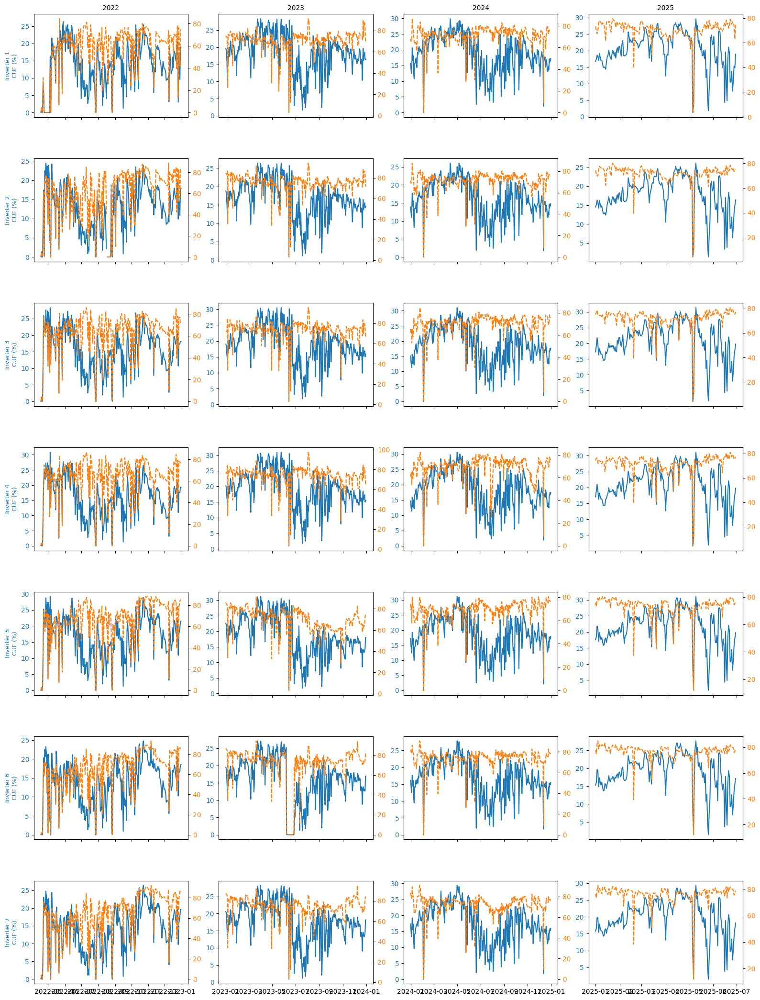

In [ ]:
plot_inverter_cuf_pr_by_year(df_pr_ok_3)

In [ ]:
def plot_inverter_cuf_pr_by_year_and_overall(combined_df):
    """
    Plots CUF and PR for each inverter by year and also for the overall period.
    Utilizes the `plot_inverter_cuf_pr` function.

    Parameters:
    - combined_df: pandas DataFrame with:
        * 'Date' column (datetime),
        * '<Inverter Name> CUF' columns,
        * '<Inverter Name> PR' columns.
    """
    # Ensure 'Date' is datetime
    combined_df['Date'] = pd.to_datetime(combined_df['Date'])

    # Extract year for grouping
    combined_df['Year'] = combined_df['Date'].dt.year

    # Group by year and plot each
    for year, df_year in combined_df.groupby('Year'):
        print(f"\n--- Plotting Year: {year} ---")
        plot_inverter_cuf_pr(df_year)

    # Also plot overall
    print("\n--- Plotting Overall ---")
    plot_inverter_cuf_pr(combined_df)

    # Drop 'Year' column if needed
    combined_df.drop(columns='Year', inplace=True)


--- Plotting Year: 2022 ---


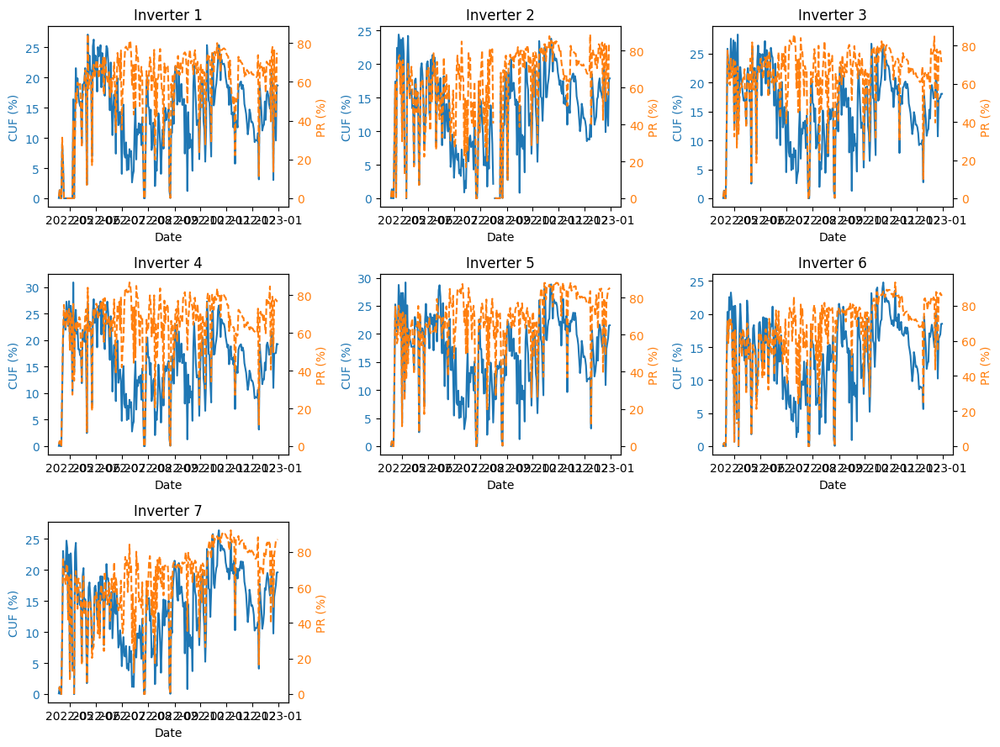


--- Plotting Year: 2023 ---


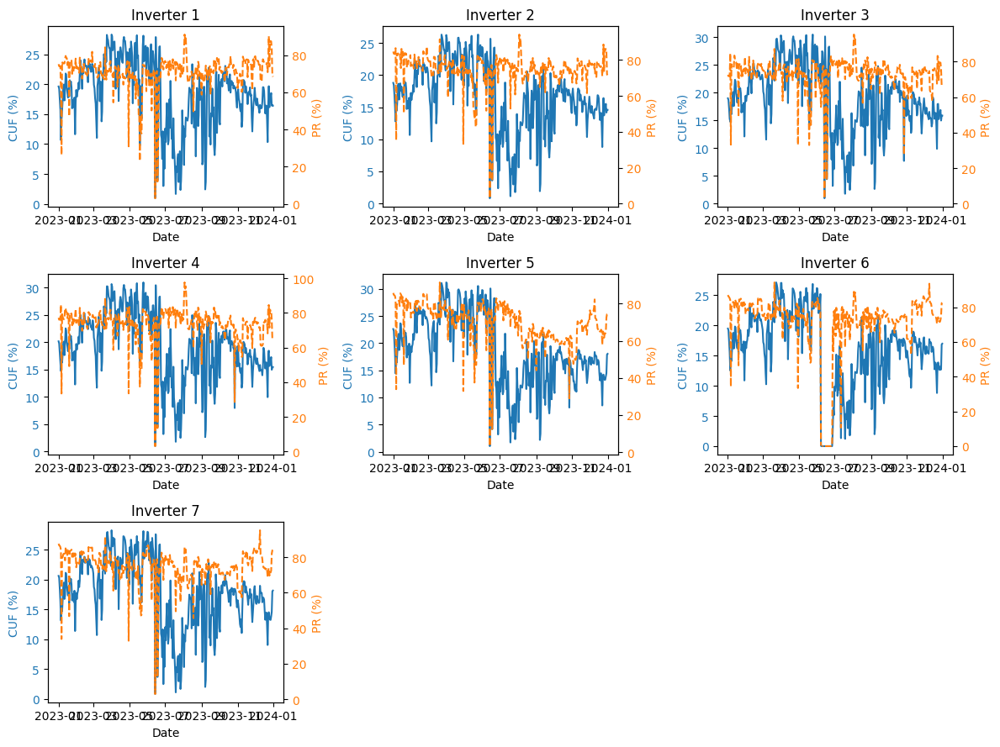


--- Plotting Year: 2024 ---


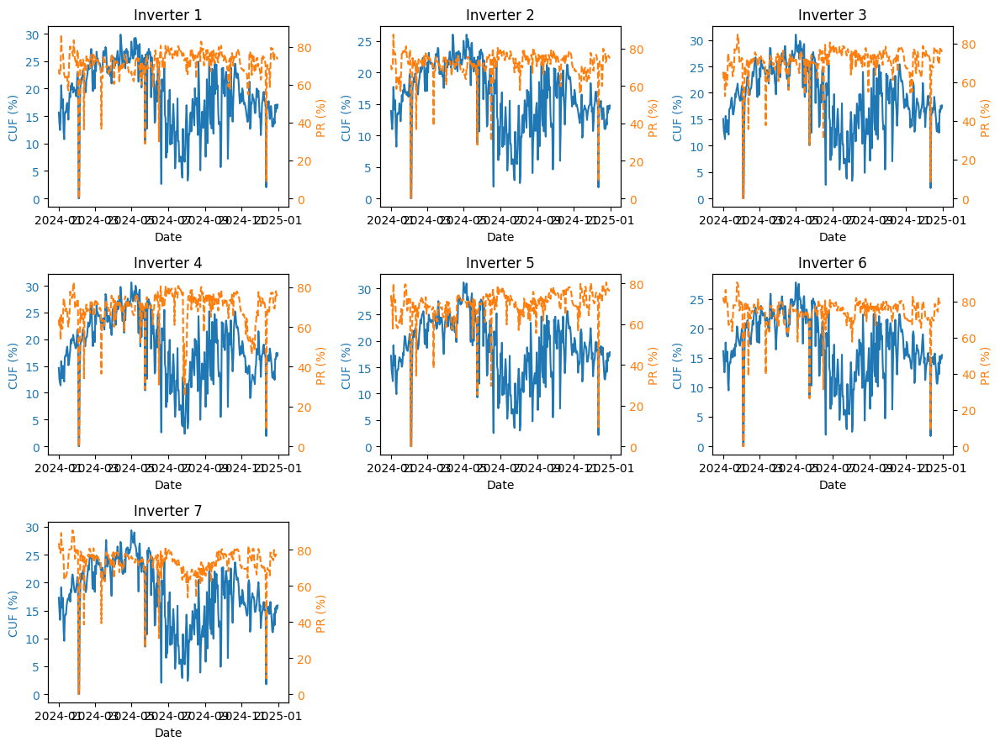


--- Plotting Year: 2025 ---


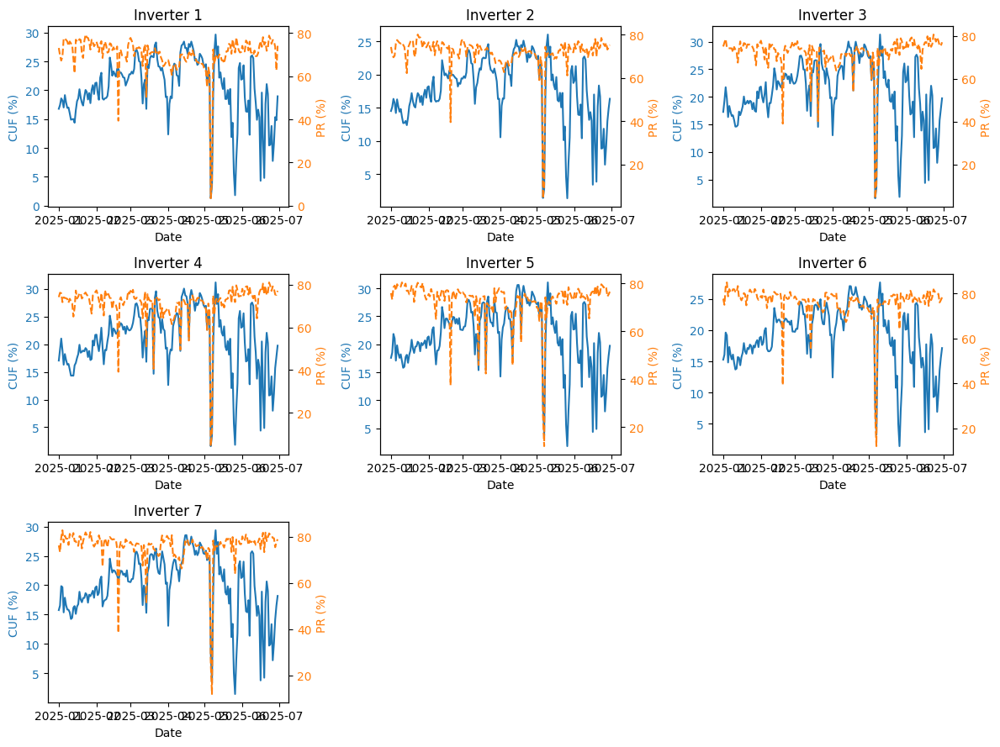


--- Plotting Overall ---


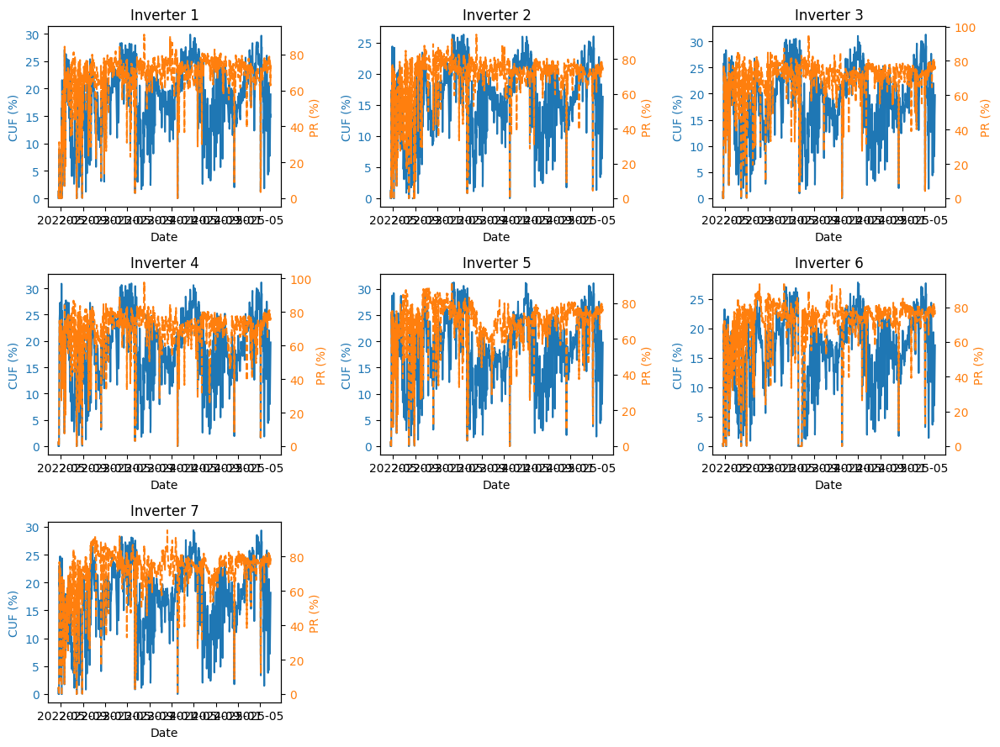

In [ ]:
plot_inverter_cuf_pr_by_year_and_overall(df_pr_ok_3)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def plot_all_inverter_pr_cuf_by_year(combined_df):
    """
    Plots PR and CUF over time for all inverters separately for each year and for lifetime.
    Each plot is full-width. Total plots = number of years + 1 (lifetime).
    """

    # Ensure 'Date' is datetime
    combined_df['Date'] = pd.to_datetime(combined_df['Date'])
    combined_df['Year'] = combined_df['Date'].dt.year
    years = sorted(combined_df['Year'].unique())
    full_years = years + ['Lifetime']

    pr_cols = [col for col in combined_df.columns if col.endswith(' PR')]
    cuf_cols = [col for col in combined_df.columns if col.endswith(' CUF')]
    pr_inverters = [col.replace(' PR', '') for col in pr_cols]
    num_pr = len(pr_cols)

    color_map = cm.get_cmap('tab20', num_pr)
    colors = [color_map(i) for i in range(num_pr)]

    # Loop over years + 'Lifetime'
    for year in full_years:
        if year == 'Lifetime':
            df = combined_df.copy()
        else:
            df = combined_df[combined_df['Year'] == year]

        # --- PR Plot ---
        plt.figure(figsize=(18, 4))  # Full-width horizontal plot
        for i, col in enumerate(pr_cols):
            plt.plot(
                df['Date'], df[col],
                label=pr_inverters[i],
                color=colors[i],
                marker='o', markersize=2, linewidth=1
            )
        plt.title(f"PR vs Date - {year}")
        plt.xlabel("Date")
        plt.ylabel("Performance Ratio (%)")
        plt.legend(
            loc='upper center',
            bbox_to_anchor=(0.5, -0.15),
            ncol=4,
            fontsize='small'
        )
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # --- CUF Plot ---
        plt.figure(figsize=(18, 4))  # Full-width horizontal plot
        for i, col in enumerate(cuf_cols):
            plt.plot(
                df['Date'], df[col],
                label=pr_inverters[i],
                color=colors[i],
                marker='o', markersize=2, linewidth=1
            )
        plt.title(f"CUF vs Date - {year}")
        plt.xlabel("Date")
        plt.ylabel("CUF (%)")
        plt.legend(
            loc='upper center',
            bbox_to_anchor=(0.5, -0.15),
            ncol=4,
            fontsize='small'
        )
        plt.grid(True)
        plt.tight_layout()
        plt.show()

/tmp/ipython-input-35-140896223.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_pr)


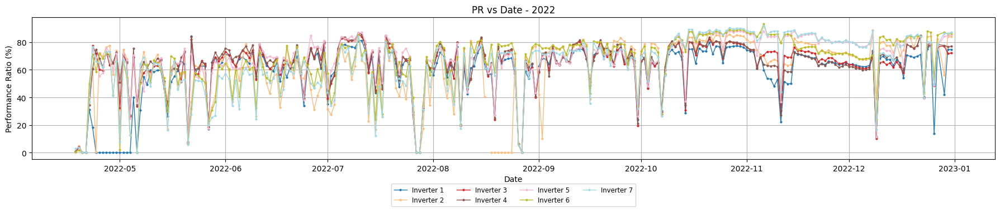

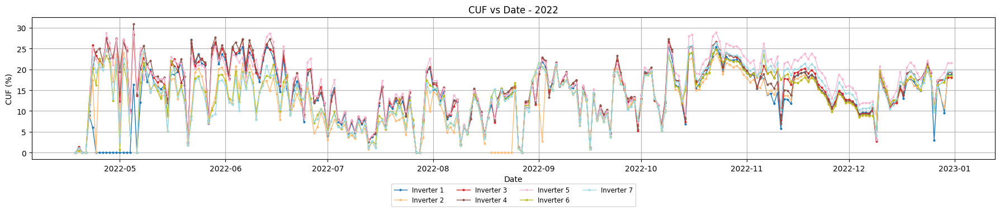

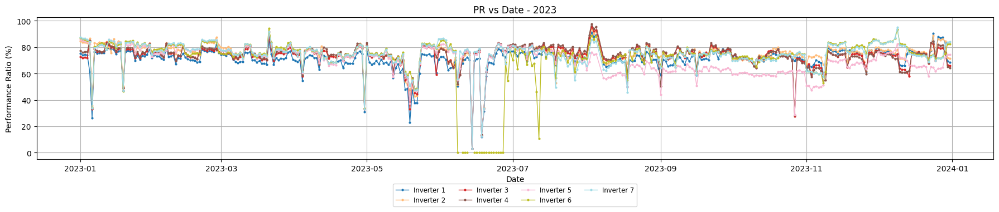

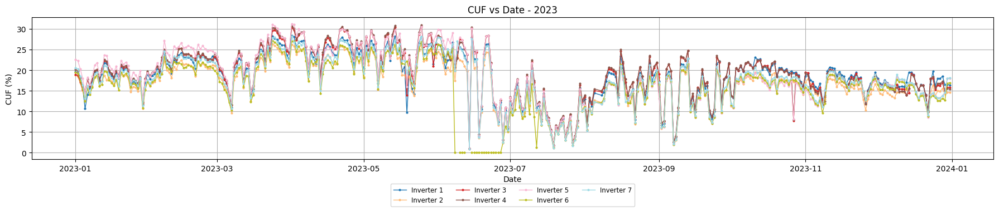

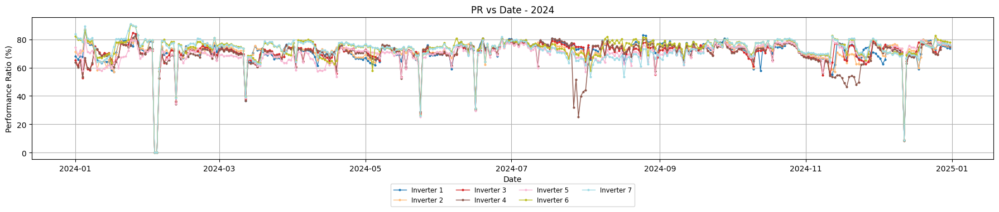

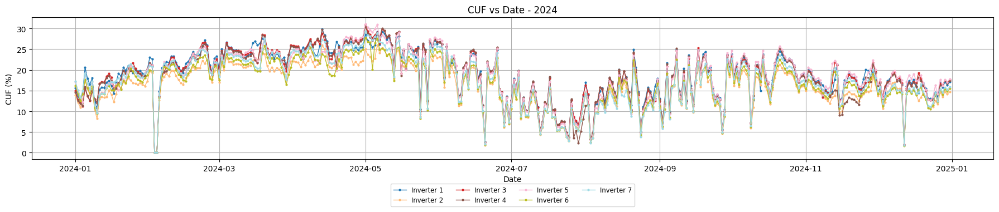

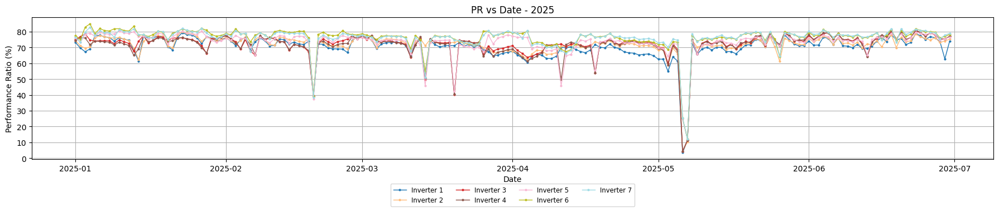

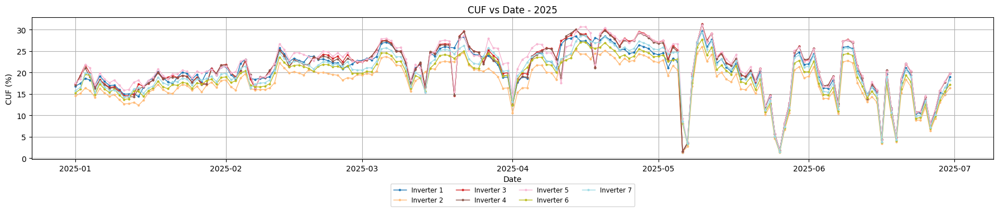

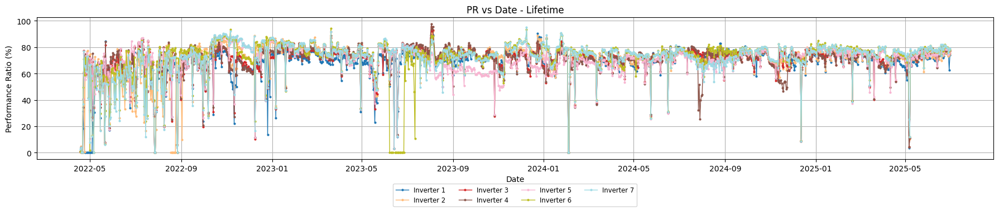

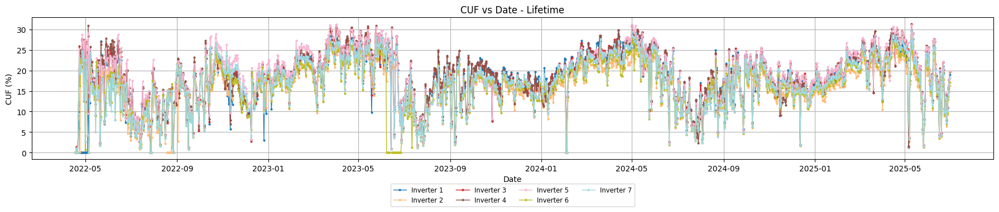

In [ ]:
plot_all_inverter_pr_cuf_by_year(df_pr_ok_3)

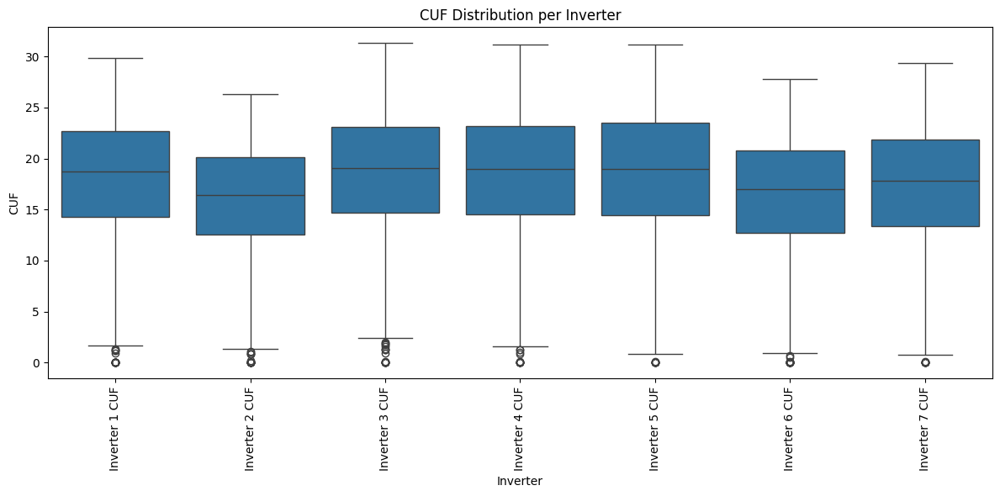

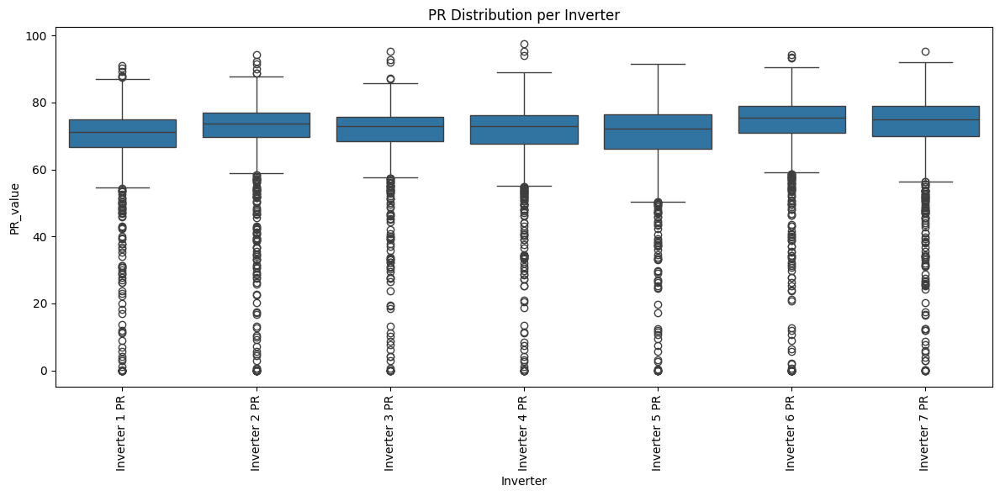

In [ ]:
plot_pr_cuf_distributions(df_pr_ok_3)

# **DMART ADGAON**

In [ ]:
# Path to your folder
folder_path_5= '/content/drive/My Drive/FPE Data/LOG BOOKS/DMART ADGAON/'
excel_files_5 = glob.glob(os.path.join(folder_path_5, "*.xlsx"))
print(f"Found {len(excel_files_5)} Excel files.")

Found 42 Excel files.


In [ ]:
# 4️⃣ Run the combiner
combined_df_5 = combiner(excel_files_5)

✔ Processed: Log Book - D Mart (Adgaon) - Sun Jun 01 2025.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Thu May 01 2025.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Tue Apr 01 2025.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Sat Mar 01 2025.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Sat Feb 01 2025.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Wed Jan 01 2025.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Sun Dec 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Fri Nov 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Tue Oct 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Sun Sep 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Thu Aug 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Mon Jul 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Sat Jun 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Wed May 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Mon Apr 01 2024.xlsx
✔ Processed: Log Book - D Mart (Adgaon) - Fri Mar 01 20

In [ ]:
# FOR ADGAON area of panel= 2.274x1.134=2.578716m^2 and efficiency: 20.94% rating:540Wp.
combined_df_5 = add_cuf_pr_from_specs(combined_df_5, folder_path_5,'Inverter_Data_DMART_ADGAON.xlsx',2.578716,0.54,True,0.2113)

⚠️ Rows with POA Energy = 0 (excluded):


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),INV 1,INV 2,INV 3,INV 4,Meter 1,DG Run Time,CUF (%),AC Yield,DayIndex
0,2022-03-01,0,0,0,0,0,0,0,0,0,0,0,0,00:00:00,0,0,1
1,2022-03-02,0,0,0,0,0,0,0,0,0,0,0,0,00:00:00,0,0,2


In [ ]:
output_path_5 = folder_path_5 + "/combined_with_PR_CUF.xlsx"
combined_df_5.to_excel(output_path_5, index=False)

In [ ]:
def split_pr_flagged_rows(df, threshold=200, date_col="Date", verbose=True):
    """
    Splits DataFrame into flagged and clean rows based on PR threshold.
    Prints summary of high PR values grouped by date and inverter.

    Args:
        df (pd.DataFrame): Input DataFrame with PR columns.
        threshold (float): PR threshold to flag.
        date_col (str): Name of column containing dates (or None to use index).
        verbose (bool): Whether to print detailed flagged info.

    Returns:
        flagged_df (pd.DataFrame): Rows where any PR > threshold.
        clean_df (pd.DataFrame): Remaining rows with all PR ≤ threshold.
    """
    pr_columns = [col for col in df.columns if "PR" in col]

    # Mask where any PR exceeds threshold
    high_pr_mask = df[pr_columns].gt(threshold).any(axis=1)
    flagged_df = df[high_pr_mask].copy()
    clean_df = df[~high_pr_mask].copy()

    if verbose:
        print(f"\n⚠️  Flagged rows: {len(flagged_df)} with PR > {threshold}")
        print(f"✅ Clean rows:   {len(clean_df)} with PR ≤ {threshold}")

        # Group and summarize by date
        print("\n📅 High PR summary by date and inverter:")
        for idx, row in flagged_df.iterrows():
            date_val = row[date_col] if date_col and date_col in df.columns else idx
            high_inverters = [
                col for col in pr_columns if pd.notna(row[col]) and row[col] > threshold
            ]
            if high_inverters:
                print(f"\n📌 Date: {date_val}")
                for col in high_inverters:
                    print(f"  ⚠️ {col}: {row[col]:.2f}")

    return flagged_df, clean_df
flagged_df, clean_df_5 = split_pr_flagged_rows(combined_df_5, threshold=200, date_col="Date")


⚠️  Flagged rows: 11 with PR > 200
✅ Clean rows:   1205 with PR ≤ 200

📅 High PR summary by date and inverter:

📌 Date: 2022-09-12 00:00:00
  ⚠️ Inverter 4 PR: 236.15

📌 Date: 2022-09-14 00:00:00
  ⚠️ Inverter 4 PR: 257.47

📌 Date: 2022-09-15 00:00:00
  ⚠️ Inverter 4 PR: 288.62

📌 Date: 2022-09-16 00:00:00
  ⚠️ Inverter 4 PR: 263.04

📌 Date: 2022-09-18 00:00:00
  ⚠️ Inverter 4 PR: 233.23

📌 Date: 2022-09-19 00:00:00
  ⚠️ Inverter 4 PR: 277.58

📌 Date: 2022-09-26 00:00:00
  ⚠️ Inverter 4 PR: 264.47

📌 Date: 2022-09-29 00:00:00
  ⚠️ Inverter 4 PR: 253.67

📌 Date: 2022-10-07 00:00:00
  ⚠️ Inverter 4 PR: 267.27

📌 Date: 2022-10-08 00:00:00
  ⚠️ Inverter 4 PR: 277.36

📌 Date: 2022-12-05 00:00:00
  ⚠️ Inverter 4 PR: 234.81


In [ ]:
df_pr_ok_5, df_pr_error_5 = split_and_display_pr_errors(combined_df_5)

⚠️ Rows with PR > 100% detected:


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),INV 1,INV 2,...,AC Yield,DayIndex,Inverter 1 CUF,Inverter 1 PR,Inverter 2 CUF,Inverter 2 PR,Inverter 3 CUF,Inverter 3 PR,Inverter 4 CUF,Inverter 4 PR
195,2022-09-12,9.23,2.6,79.75,3.26,3.26,983,1082.9,382.3,381.8,...,0,196,15.929167,80.909972,15.908333,80.804152,12.075758,69.027851,33.208333,236.147911
197,2022-09-14,9.19,2.49,86.76,2.87,2.87,943,1038.4,366.0,366.4,...,0,198,15.250000,87.986196,15.266667,88.082355,11.590909,75.259819,31.875000,257.467802
198,2022-09-15,10.61,1.81,87.02,2.08,2.08,685,766.3,258.7,259.0,...,0,199,10.779167,85.812083,10.791667,85.911595,9.416667,84.364829,25.895833,288.616519
199,2022-09-16,10.34,1.34,79.76,1.68,1.68,508,566.6,191.6,192.0,...,0,200,7.983333,78.686744,8.000000,78.851017,6.931818,76.889219,19.062500,263.042064
201,2022-09-18,10.65,1.65,70.51,2.34,2.34,622,696.1,234.8,235.3,...,0,202,9.783333,69.230519,9.804167,69.377943,8.560606,68.173599,23.541667,233.22547
202,2022-09-19,10.64,1.62,83.51,1.94,1.94,613,686,231.4,231.6,...,0,203,9.641667,82.295668,9.650000,82.366797,8.446970,81.138462,23.229167,277.57895
209,2022-09-26,10.92,1.96,78.4,2.5,2.5,740,830.7,278.9,278.0,...,0,210,11.620833,76.97042,11.583333,76.722039,10.371212,77.306689,28.520833,264.470253
212,2022-09-29,10.99,2.29,75.08,3.05,3.05,867,974,332.8,320.8,...,0,213,13.866667,75.283332,13.366667,72.568788,12.136364,74.15088,33.375000,253.674062
220,2022-10-07,10.79,1.77,80.09,2.21,2.21,669,749.9,253.6,251.7,...,0,221,10.566667,79.17213,10.487500,78.578963,9.265152,78.124602,25.479167,267.268376
221,2022-10-08,10.78,2.03,82.86,2.45,2.45,768,860.8,288.7,290.7,...,0,222,12.029167,81.301031,12.112500,81.864252,10.659091,81.074009,29.312500,277.358452


/tmp/ipython-input-205-1927115763.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Inverter', y=metric.upper(), data=melt_df, palette='Set2')


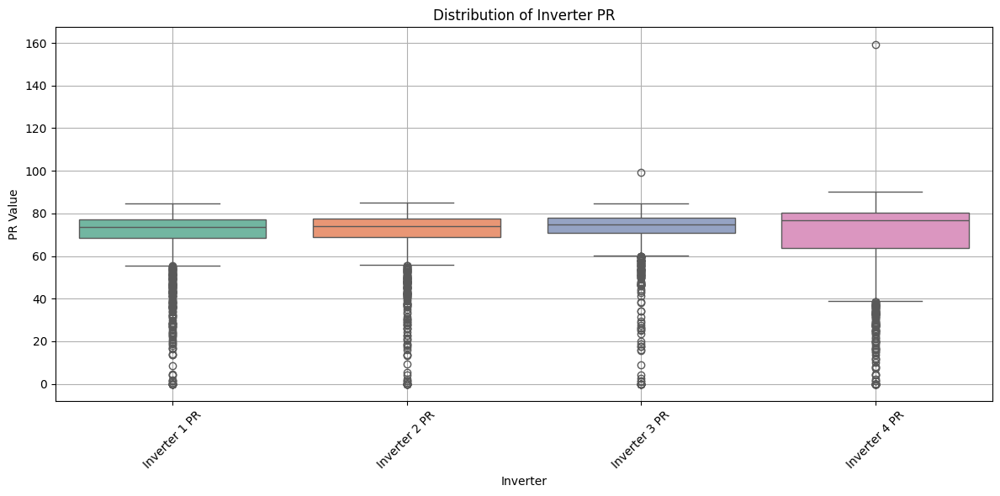

,Inverter,Data Points,Mean PR,Std Dev,Min PR,Max PR,Median PR
0,Inverter 1,1162,68.584717,15.134648,0.0,84.857828,73.445244
1,Inverter 2,1162,69.602104,14.334633,0.0,84.927423,73.941074
2,Inverter 3,1162,71.814660,12.331684,0.0,99.097283,74.783422
3,Inverter 4,1045,67.508623,21.560875,0.0,159.439536,76.843828


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_inverter_pr_or_cuf_distribution(df, metric='CUF'):
    """
    Plots the distribution of Inverter CUF or PR values from the given DataFrame.

    Parameters:
        df (pd.DataFrame): DataFrame containing Inverter CUF or PR columns like 'Inverter 1 CUF'
        metric (str): Either 'CUF' or 'PR' to specify which metric to plot
    """

    # Extract inverter columns based on metric
    cols = [col for col in df.columns if metric.upper() in col.upper() and 'Inverter' in col]

    if not cols:
        print(f"No columns found with '{metric}' in their name.")
        return

    # Melt for seaborn
    melt_df = df[cols].melt(var_name='Inverter', value_name=metric.upper())

    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Inverter', y=metric.upper(), data=melt_df, palette='Set2')
    plt.title(f'Distribution of Inverter {metric.upper()}')
    plt.xticks(rotation=45)
    plt.ylabel(f'{metric.upper()} Value')
    plt.xlabel('Inverter')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
# For PR
plot_inverter_pr_or_cuf_distribution(clean_df_5, metric='PR')
def summarize_inverter_pr(df):
    """
    Generates a summary (count, mean, std dev, min, max, median) of PR for each inverter.

    Parameters:
        df (pd.DataFrame): DataFrame containing columns like 'Inverter X PR'

    Returns:
        pd.DataFrame: Summary table with inverter-wise statistics
    """

    pr_cols = [col for col in df.columns if 'PR' in col and 'Inverter' in col]

    if not pr_cols:
        print("No PR columns found.")
        return None

    summary = []

    for col in pr_cols:
        inverter = col.replace(' PR', '')
        series = df[col].dropna()  # Ignore NaNs for valid count and stats

        stats = {
            'Inverter': inverter,
            'Data Points': series.count(),
            'Mean PR': series.mean(),
            'Std Dev': series.std(),
            'Min PR': series.min(),
            'Max PR': series.max(),
            'Median PR': series.median()
        }
        summary.append(stats)

    summary_df = pd.DataFrame(summary)
    return summary_df

pr_summary = summarize_inverter_pr(clean_df_5)
display(pr_summary)

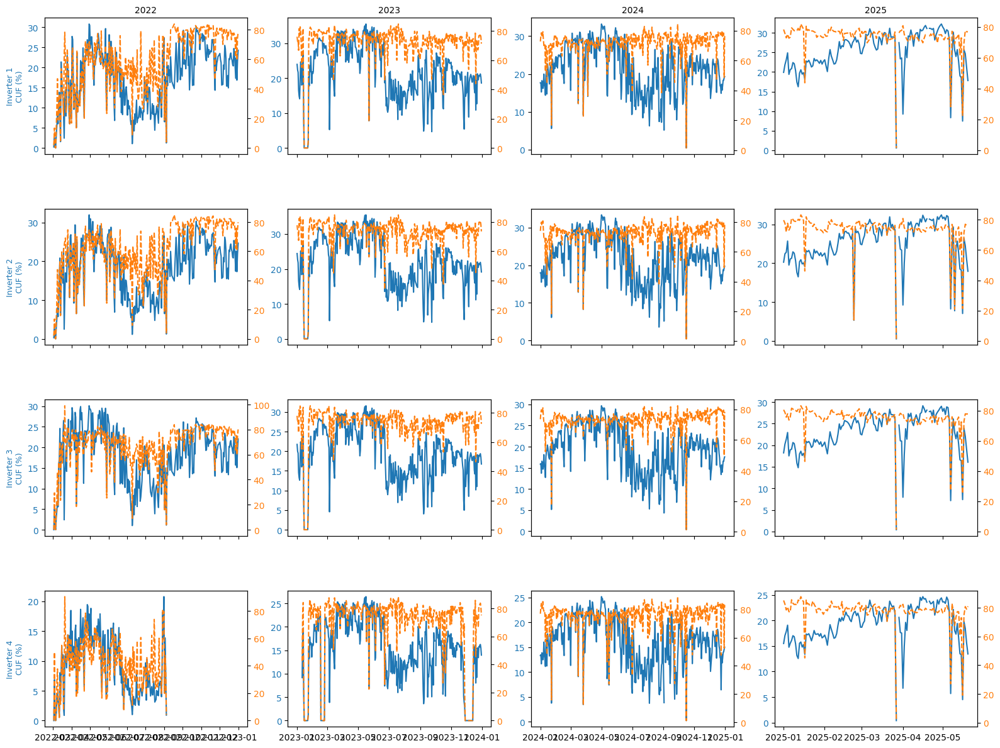

In [ ]:
plot_inverter_cuf_pr_by_year(df_pr_ok_5)


--- Plotting Year: 2022 ---


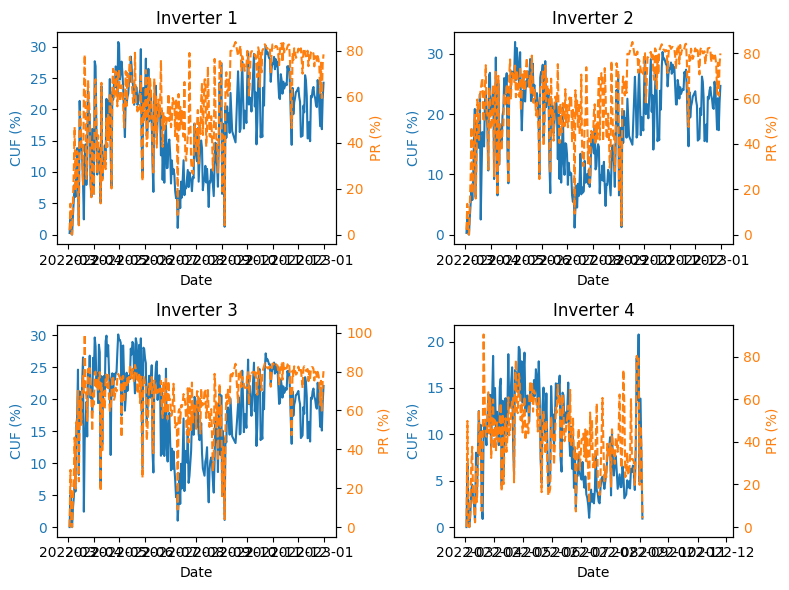


--- Plotting Year: 2023 ---


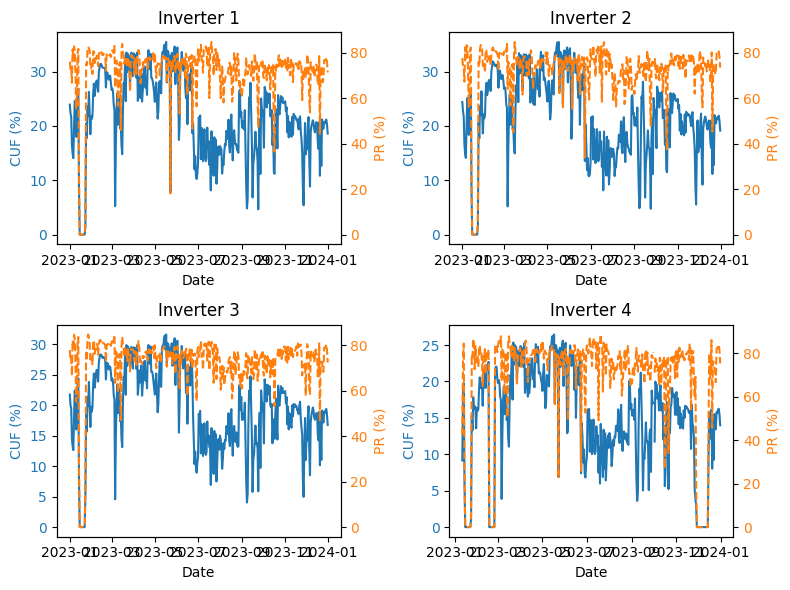


--- Plotting Year: 2024 ---


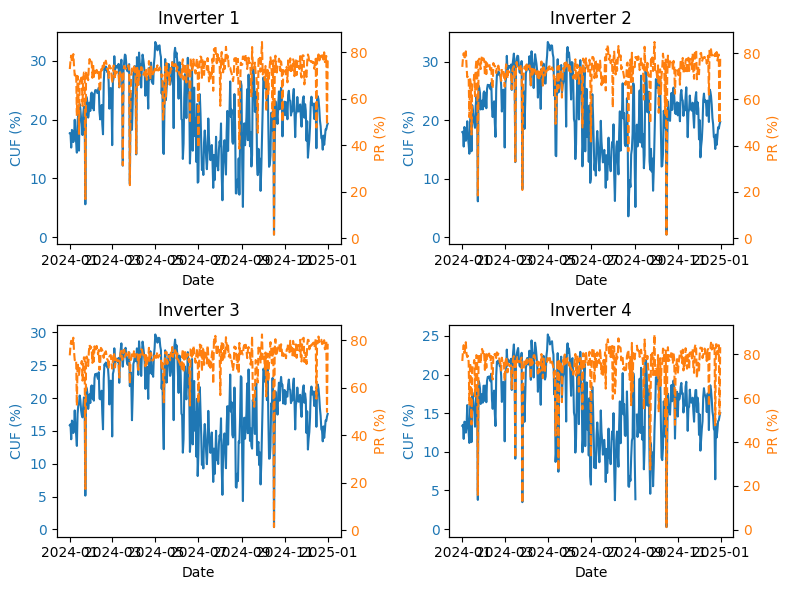


--- Plotting Year: 2025 ---


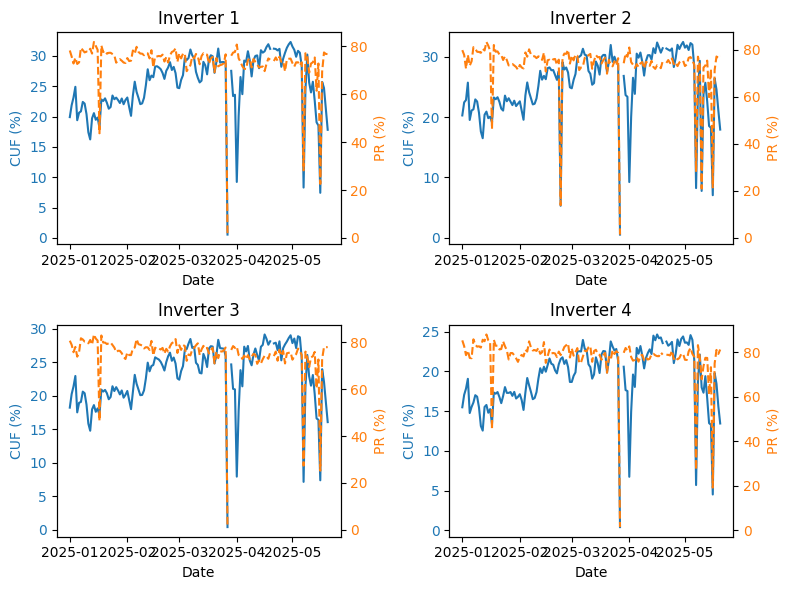


--- Plotting Overall ---


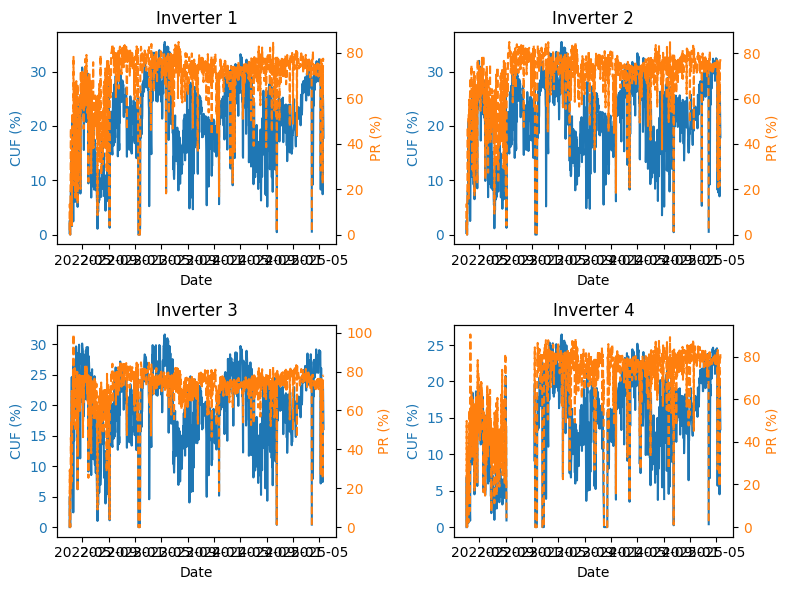

In [ ]:
plot_inverter_cuf_pr_by_year_and_overall(df_pr_ok_5)

/tmp/ipython-input-129-140896223.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_pr)


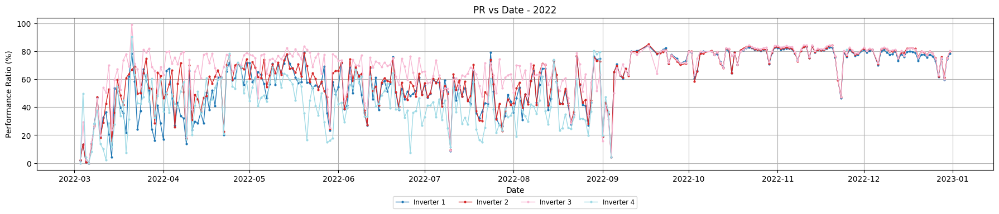

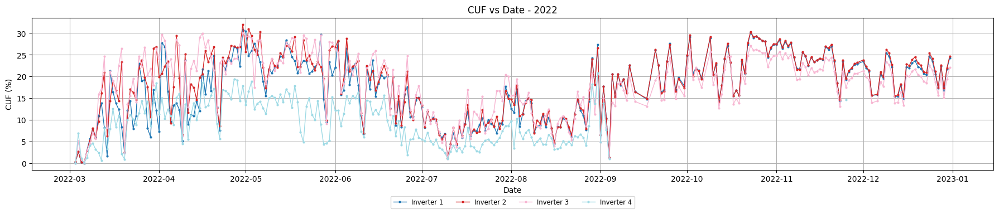

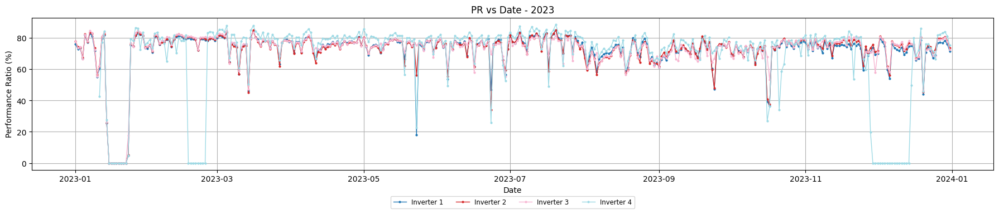

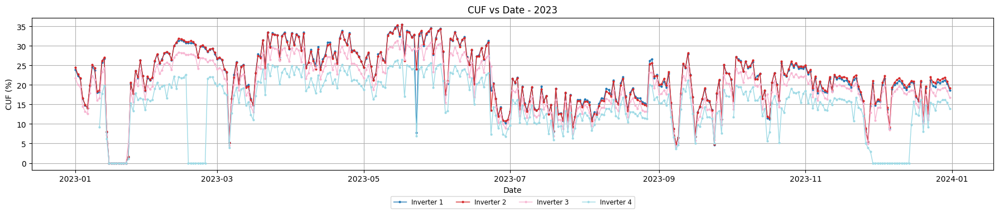

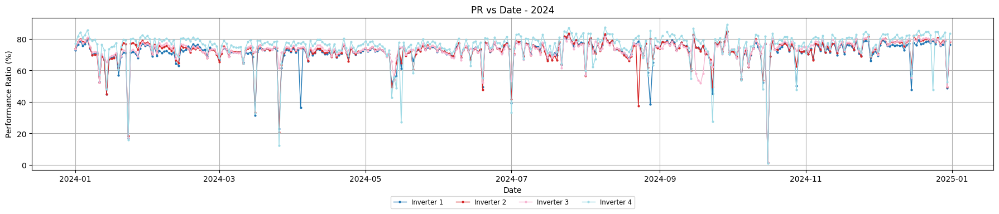

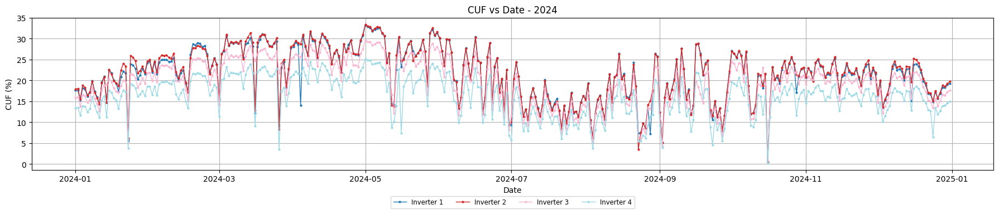

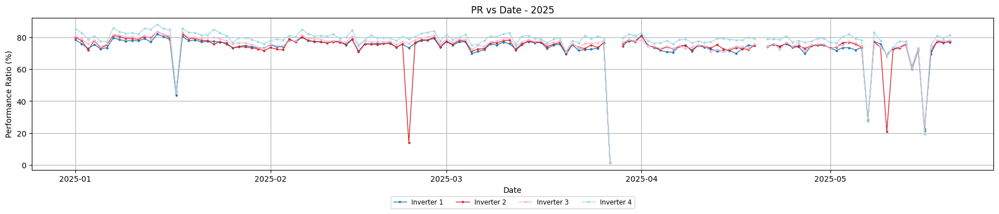

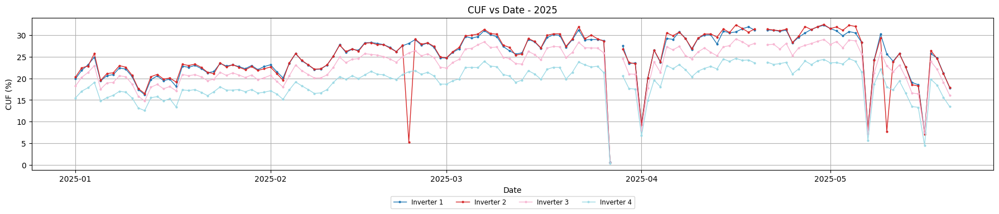

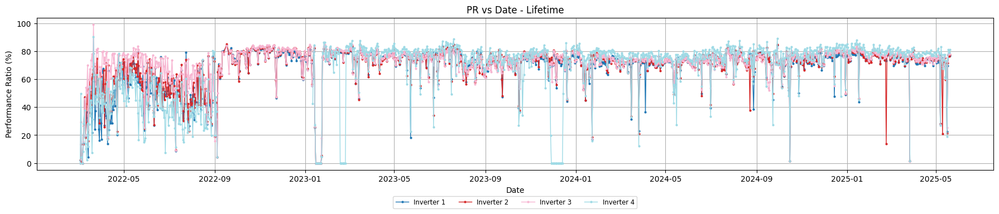

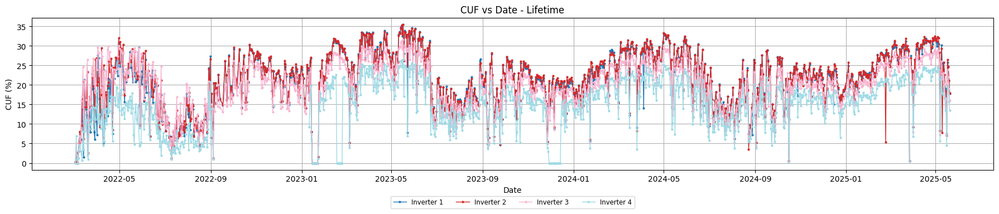

In [ ]:
plot_all_inverter_pr_cuf_by_year(df_pr_ok_5)

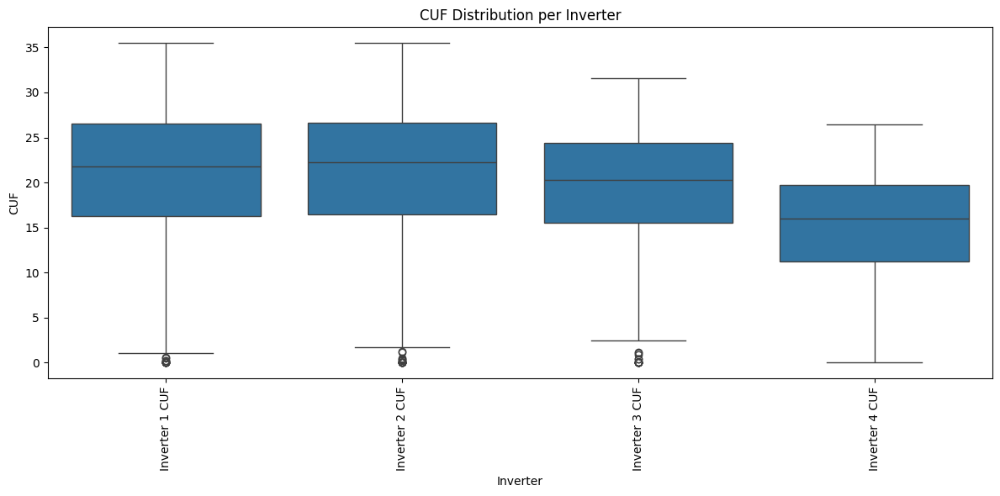

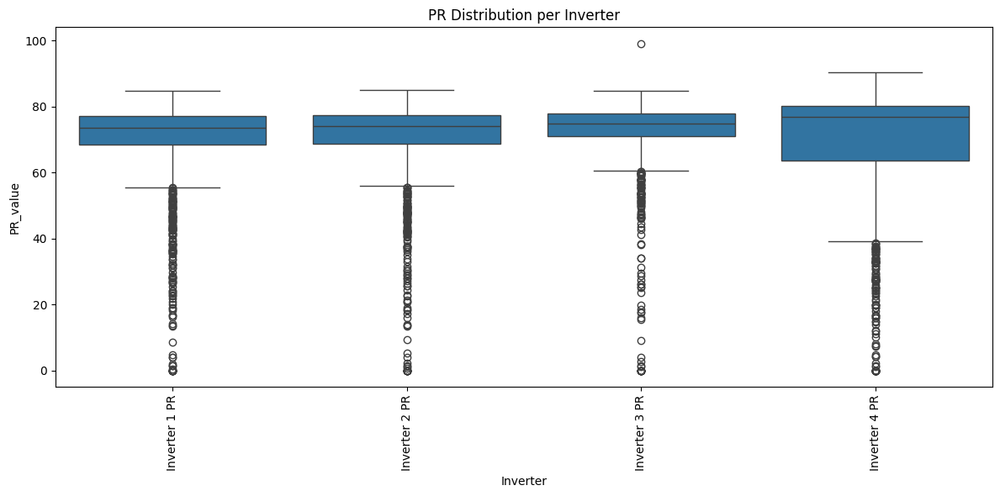

In [ ]:
plot_pr_cuf_distributions(df_pr_ok_5)

# **STAR WIRE EXT PHASE 2**

In [ ]:
folder_path_6= '/content/drive/My Drive/FPE Data/LOG BOOKS/Star wire Ext Phase 2/'
excel_files_6 = glob.glob(os.path.join(folder_path_6, "*.xlsx"))

print(f"Found {len(excel_files_6)} Excel files.")

Found 7 Excel files.


In [ ]:
combined_df_6 = combiner(excel_files_6)

✔ Processed: Log Book - Star Wire India Limited (Chhainsa-Ext -Phase 2) - Sun Jun 01 2025.xlsx
✔ Processed: Log Book - Star Wire India Limited (Chhainsa-Ext -Phase 2) - Thu May 01 2025.xlsx
✔ Processed: Log Book - Star Wire India Limited (Chhainsa-Ext -Phase 2) - Tue Apr 01 2025.xlsx
✔ Processed: Log Book - Star Wire India Limited (Chhainsa-Ext -Phase 2) - Sat Mar 01 2025.xlsx
✔ Processed: Log Book - Star Wire India Limited (Chhainsa-Ext -Phase 2) - Sat Feb 01 2025.xlsx
✔ Processed: Log Book - Star Wire India Limited (Chhainsa-Ext -Phase 2) - Wed Jan 01 2025.xlsx

✅ Combined data saved to: combined_inverter_data.xlsx


In [ ]:
# panel rating is 545Wp and Area is 2.284 * 1.137=2.596908m^2
combined_df_6 = add_cuf_pr_from_specs(combined_df_6, folder_path_6,'Inverter_Data_Starwire_ext_ph2.xlsx',2.596908,0.545,True,panel_efficiency=0.2099)

In [ ]:
output_path_6 = folder_path_6 + "/combined_with_PR_CUF.xlsx"
combined_df_6.to_excel(output_path_6, index=False)

In [ ]:
df_pr_ok_6, df_pr_error_6 = split_and_display_pr_errors(combined_df_6)

⚠️ Rows with PR > 100% detected:


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter 1,Inverter 2,...,Inverter 5 CUF,Inverter 5 PR,Inverter 6 CUF,Inverter 6 PR,Inverter 7 CUF,Inverter 7 PR,Inverter 8 CUF,Inverter 8 PR,Inverter 9 CUF,Inverter 9 PR
36,2025-02-06,0.24,2.96,86.62,3.42,3.42,3051.6,3059,208,453,...,15.265152,83.145086,16.363636,89.128232,16.704545,90.98507,12.5,70.245465,12.5,67.052489


/tmp/ipython-input-99-3056825185.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_pr)


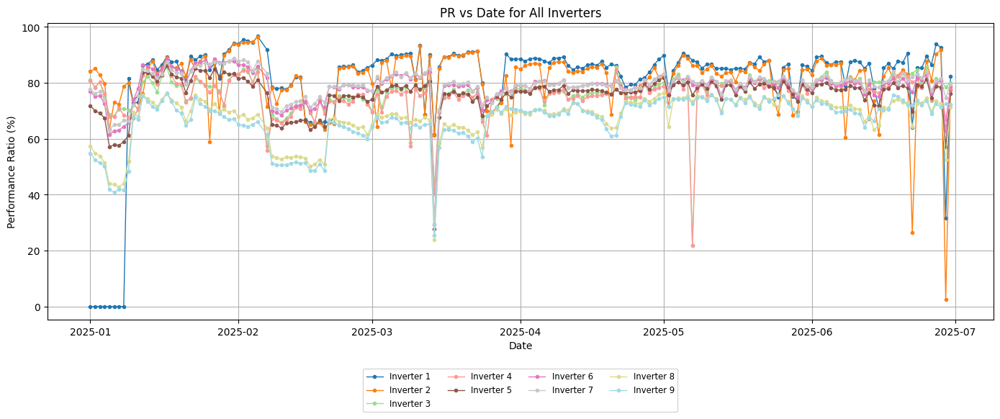

/tmp/ipython-input-99-3056825185.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_cuf)


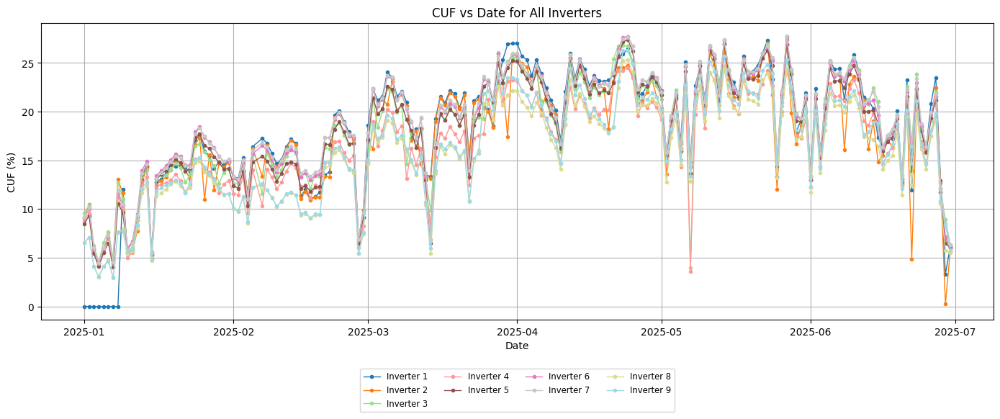

In [ ]:
plot_all_inverter_pr_cuf(df_pr_ok_6)

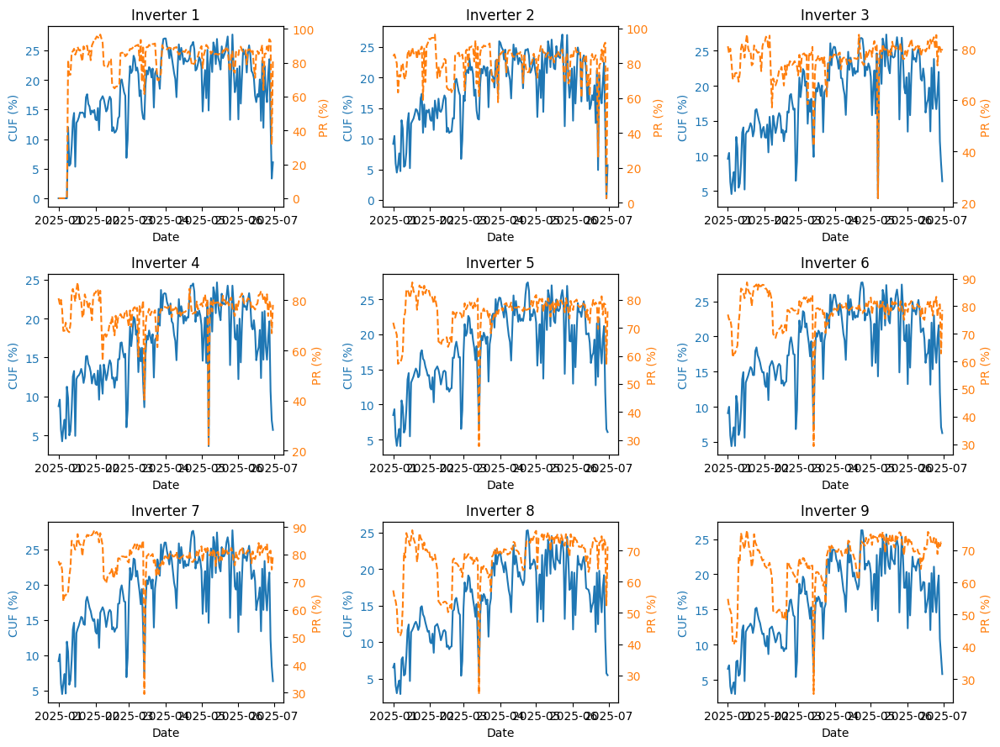

In [ ]:
plot_inverter_cuf_pr(df_pr_ok_6)

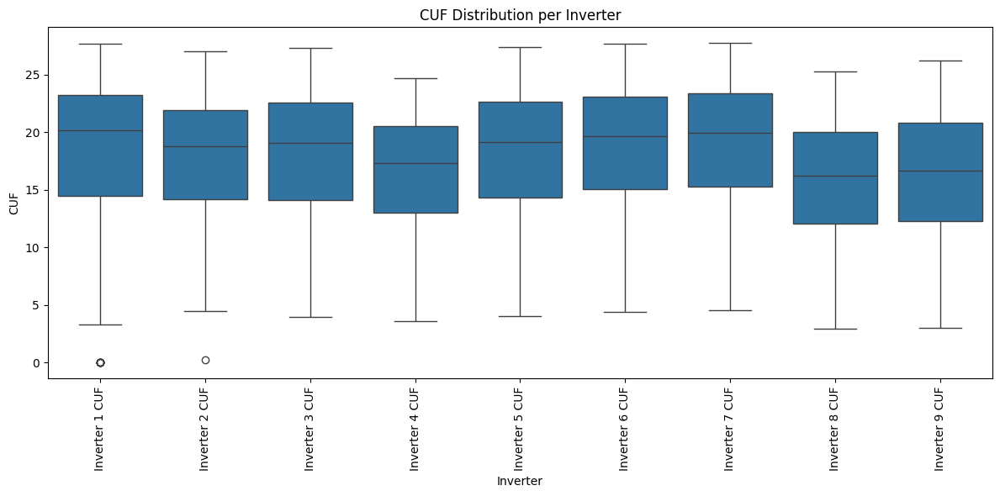

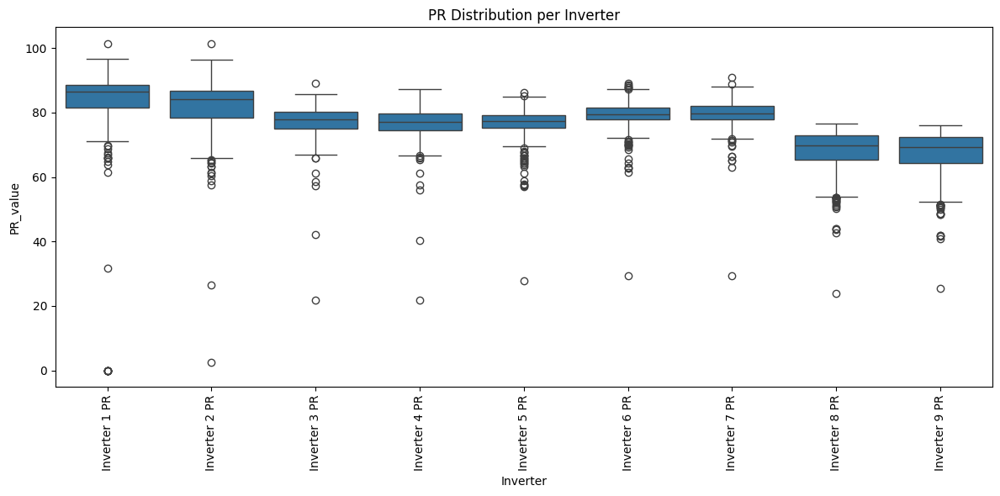

In [ ]:
plot_pr_cuf_distributions(combined_df_6)

# **DMART WARDHA**

In [ ]:
# Path to your folder
folder_path_4= '/content/drive/My Drive/FPE Data/LOG BOOKS/DMART WARDHA/'
excel_files_4 = glob.glob(os.path.join(folder_path_4, "*.xlsx"))
print(f"Found {len(excel_files_4)} Excel files.")

Found 43 Excel files.


In [ ]:
# 4️⃣ Run the combiner
combined_df_4 = combiner(excel_files_4)

✔ Processed: Log Book - D Mart (Wardha) - Sun Jun 01 2025.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Thu May 01 2025.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Tue Apr 01 2025.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Sat Mar 01 2025.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Sat Feb 01 2025.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Wed Jan 01 2025.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Sun Dec 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Fri Nov 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Tue Oct 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Sun Sep 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Thu Aug 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Mon Jul 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Sat Jun 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Wed May 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Mon Apr 01 2024.xlsx
✔ Processed: Log Book - D Mart (Wardha) - Fri Mar 01 20

In [ ]:
# FOR WARDHA area of panel= 2.187x1.102=2.410074m^2 and efficiency: 20.3 rating:495Wp
combined_df_4 = add_cuf_pr_from_specs(combined_df_4, folder_path_4,'Inverter_Data_DMART_WARDHA.xlsx',2.410074,0.45,True,0.203)

⚠️ Rows with POA Energy zero (excluded from CUF/PR calc):


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter 1,Inverter 2,Inverter 3,Inverter 4,Meter 1,DG Run Time,CUF (%),AC Yield,DayIndex
0,2022-01-01,0,0,0,0,0,0,0,0,0,0,0,130,00:00:00,0,0,1
1,2022-01-02,0,0,0,0,0,0,0,0,0,0,0,130,00:00:00,0,0,2
2,2022-01-03,0,0,0,0,0,0,0,0,0,0,0,130,00:00:00,0,0,3
5,2022-01-06,0,0,0,0,0,0,0,0,0,0,0,130,00:15:00,0,0,6
6,2022-01-07,0,0,0,0,0,0,0,0,0,0,0,130,00:10:00,0,0,7
7,2022-01-08,0,0,0,0,0,0,0,0,0,0,0,130,00:00:00,0,0,8
8,2022-01-09,0,0,0,0,0,0,0,0,0,0,0,130,00:05:00,0,0,9
9,2022-01-10,0,0,0,0,0,0,0,0,0,0,0,130,00:00:00,0,0,10
10,2022-01-11,0,0,0,0,0,0,0,0,0,0,0,130,00:55:00,0,0,11
11,2022-01-12,0,0,0,0,0,0,0,0,0,0,0,130,00:10:00,0,0,12


In [ ]:
output_path_4 = folder_path_4 + "/combined_with_PR_CUF.xlsx"
combined_df_4.to_excel(output_path_4, index=False)

In [ ]:
df_pr_ok_4, df_pr_error_4 = split_and_display_pr_errors(combined_df_4)

⚠️ Rows with PR > 100% detected:


Parameter/Device,Date,TL,Sp. Yield,PR,POA Energy,GHI Energy,Energy (Meters),Energy (Inverters),Inverter 1,Inverter 2,...,AC Yield,DayIndex,Inverter 1 CUF,Inverter 1 PR,Inverter 2 CUF,Inverter 2 PR,Inverter 3 CUF,Inverter 3 PR,Inverter 4 CUF,Inverter 4 PR
31,2022-02-01,100,0,0,0.04,0.04,0,1646.3,128.7,683.4,...,0,32,9.750000,4494.846154,28.475000,10477.742768,28.125000,10348.955763,26.533333,10719.597096
33,2022-02-03,-0.04,4.04,0,3.79,3.45,1617,1616.3,271.5,606.7,...,0,34,20.568182,100.0753,25.279167,98.171976,24.883333,96.634752,23.483333,100.130682
35,2022-02-05,-0.01,4.7,0,2.21,2.01,1881,1880.8,316.6,708.5,...,0,36,23.984848,200.131252,29.520833,196.607613,28.850000,192.139889,27.216667,199.016599
37,2022-02-07,0.03,4.36,0,3.45,3.14,1742,1742.5,293.1,656.5,...,0,38,22.204545,118.684225,27.354167,116.699336,26.729167,114.032938,25.233333,118.195834
220,2022-08-09,-18.99,0.44,0,0.28,0.28,176.1,148,25.0,62.0,...,0,221,1.893939,124.732106,2.583333,135.795822,2.541667,133.605566,NaN,NaN
239,2022-08-28,28.67,2.27,78.82,2.88,2.9,906.6,1271,235.0,514.0,...,0,240,17.803030,113.991285,21.416667,109.451919,21.750000,111.155451,NaN,NaN
241,2022-08-30,100,0,0,4.13,4.16,0,2618,483.0,1074.0,...,0,242,36.590909,163.377917,44.750000,159.480276,44.208333,157.549882,NaN,NaN
799,2024-03-10,-0.1,7.83,0,5.92,5.61,3130,3127,472.0,1189.0,...,0,800,35.757576,111.382399,49.541667,123.172256,49.500000,123.068663,46.333333,126.479016


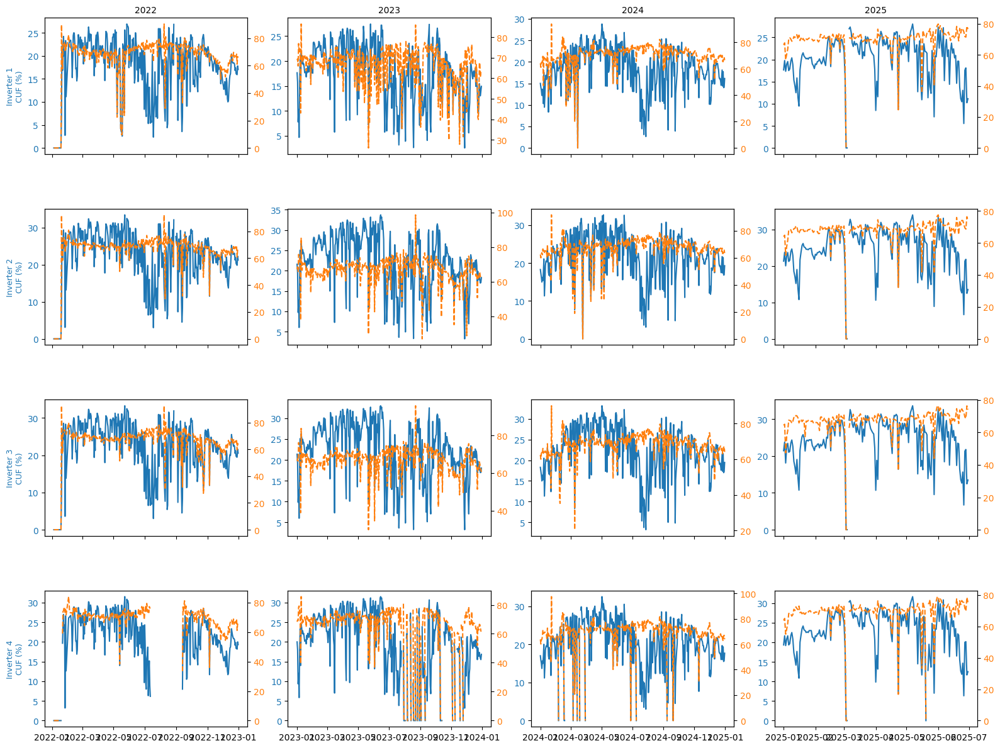

In [ ]:
plot_inverter_cuf_pr_by_year(df_pr_ok_4)


--- Plotting Year: 2022 ---


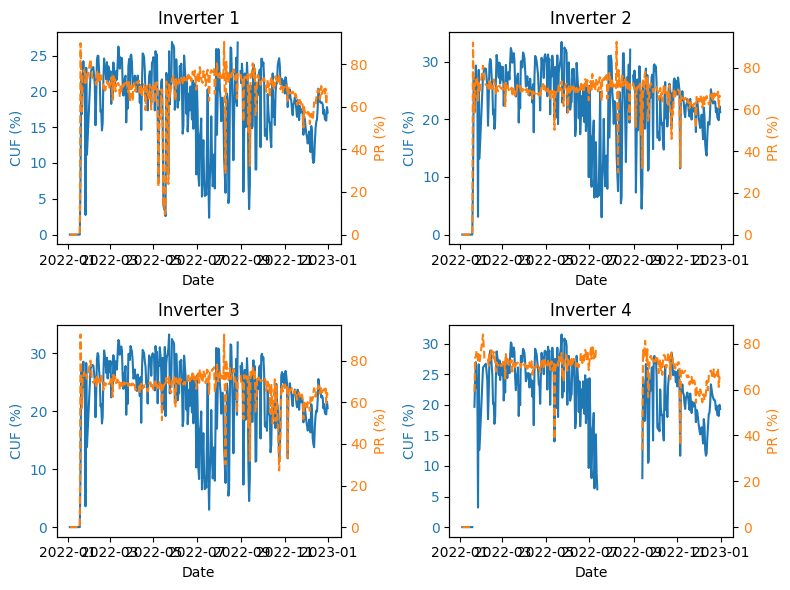


--- Plotting Year: 2023 ---


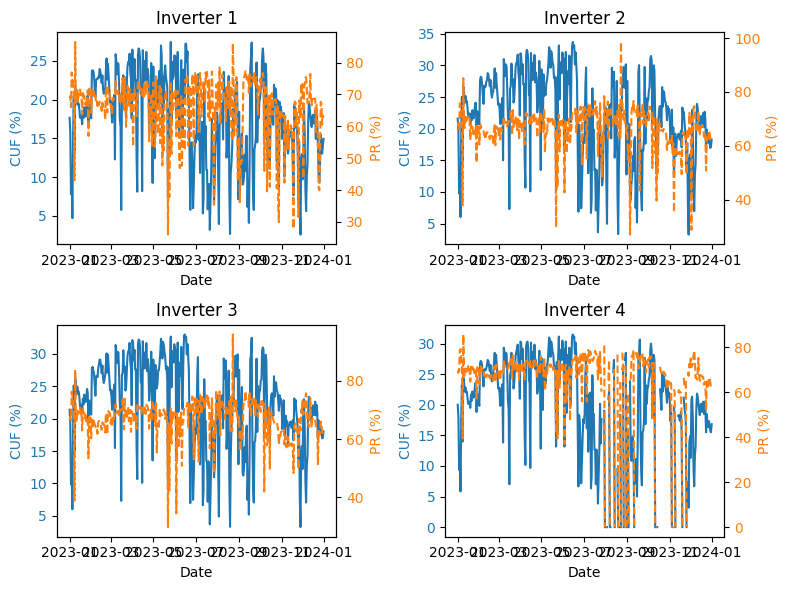


--- Plotting Year: 2024 ---


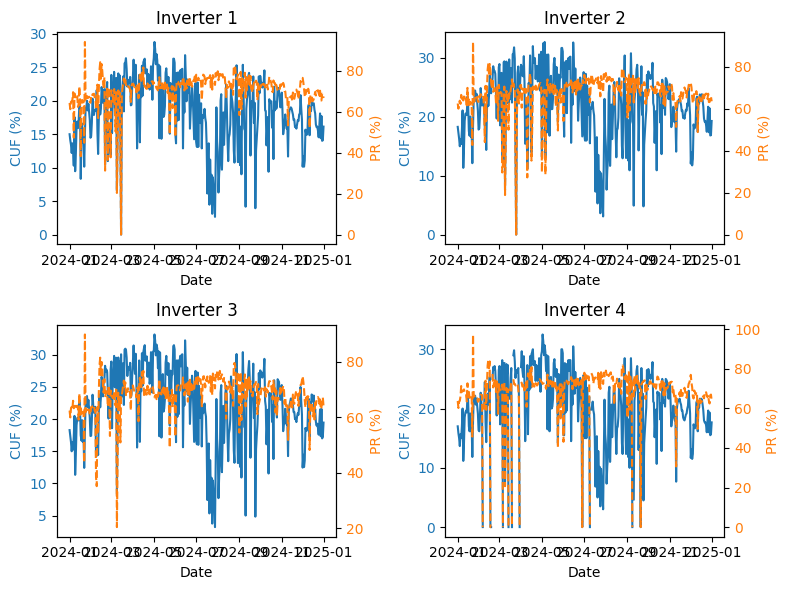


--- Plotting Year: 2025 ---


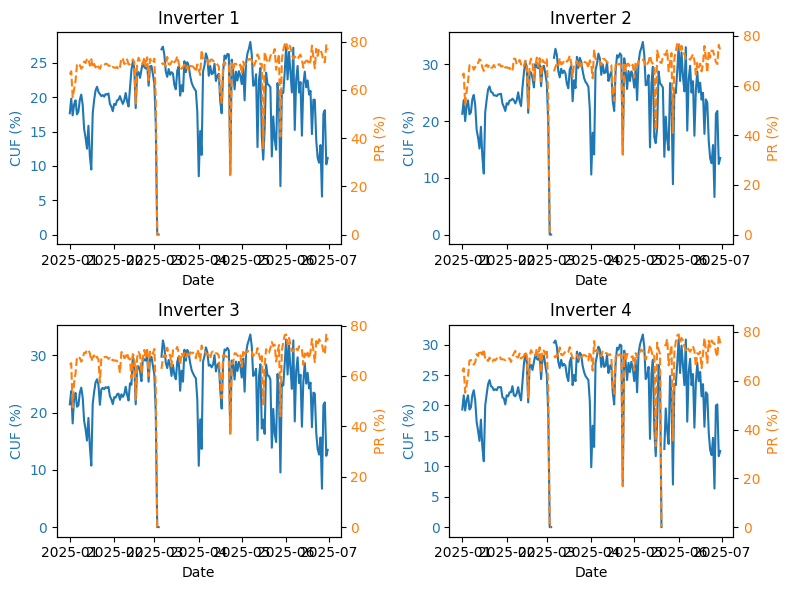


--- Plotting Overall ---


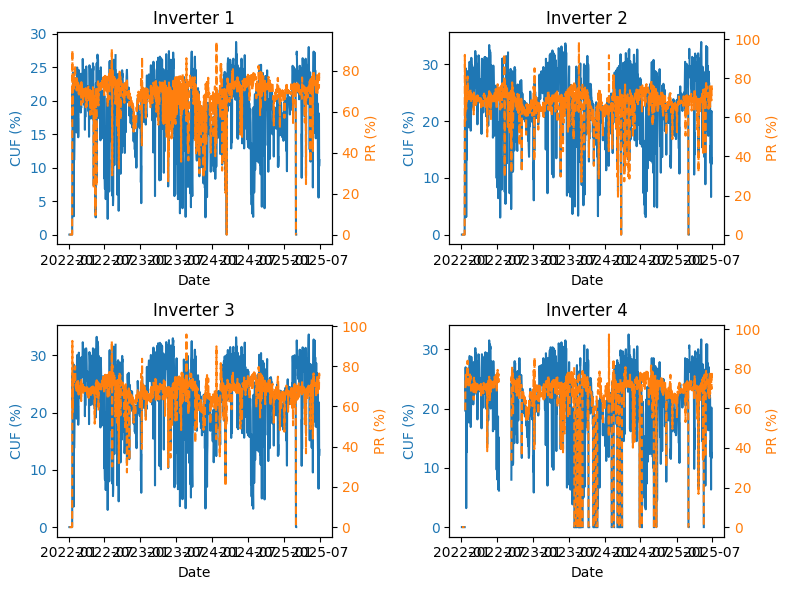

In [ ]:
plot_inverter_cuf_pr_by_year_and_overall(df_pr_ok_4)

/tmp/ipython-input-129-140896223.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = cm.get_cmap('tab20', num_pr)


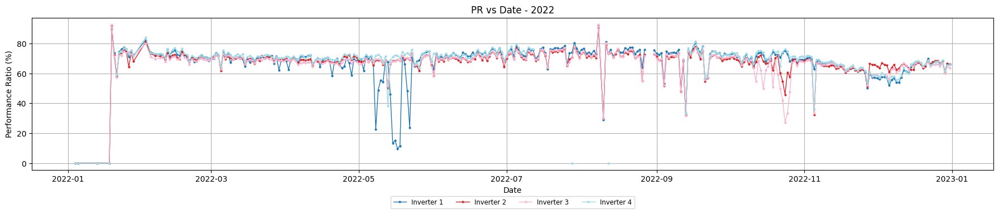

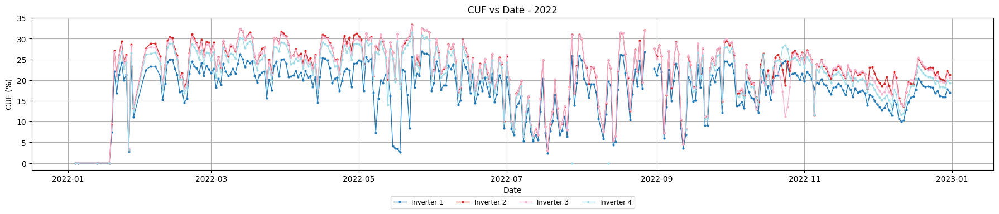

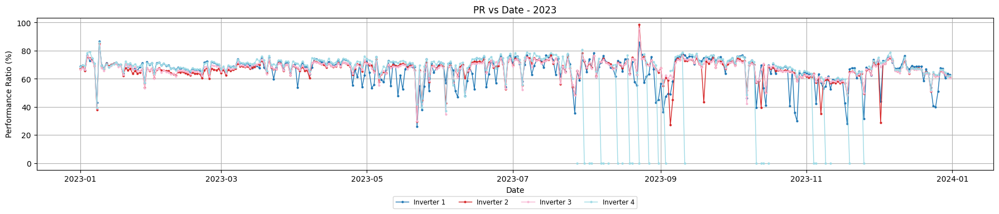

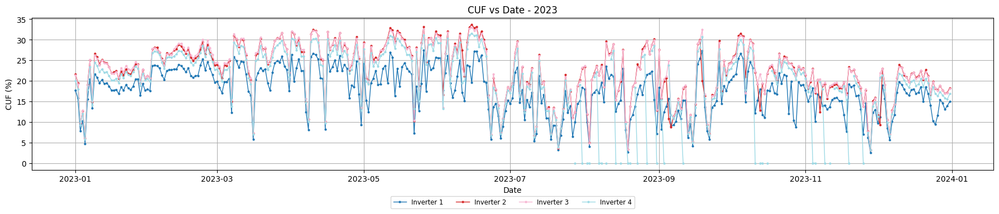

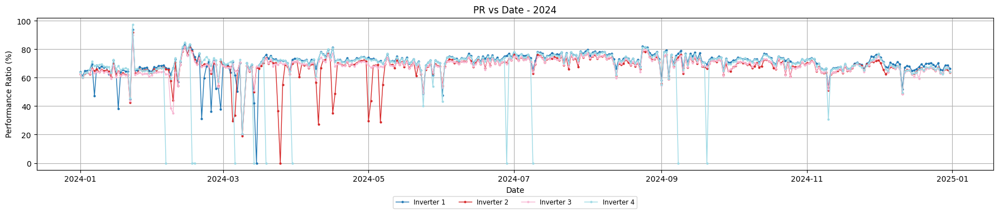

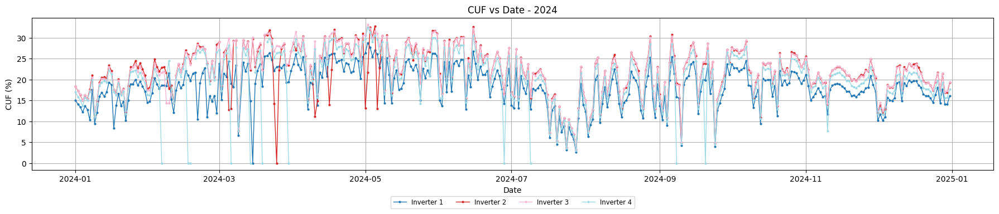

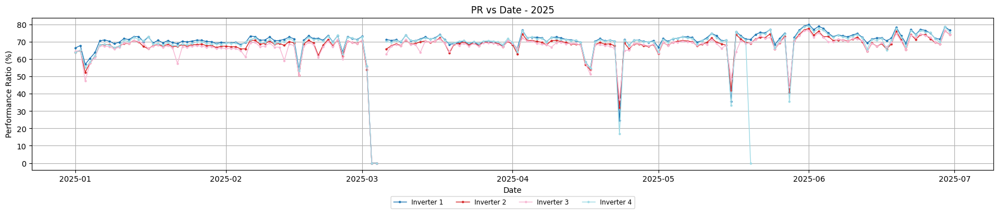

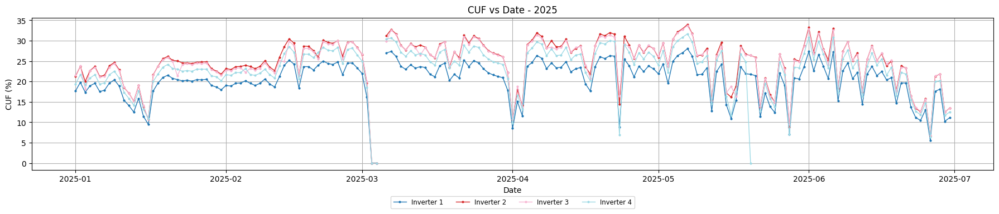

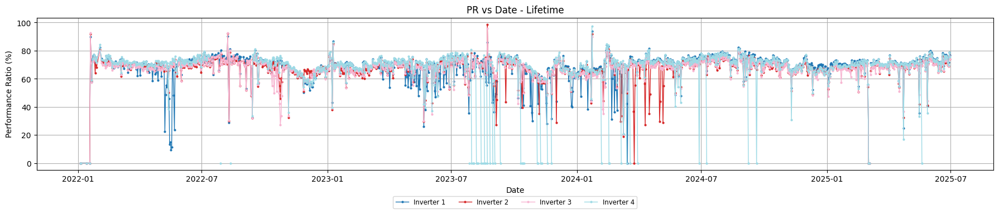

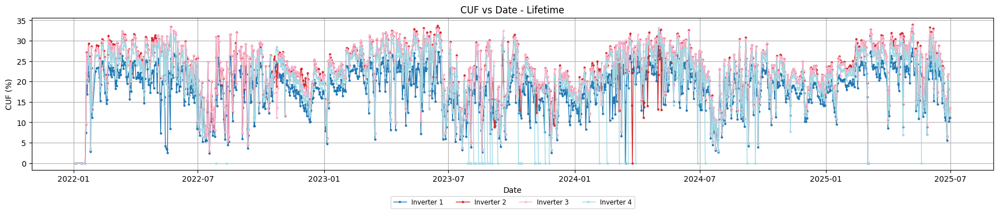

In [ ]:
plot_all_inverter_pr_cuf_by_year(df_pr_ok_4)

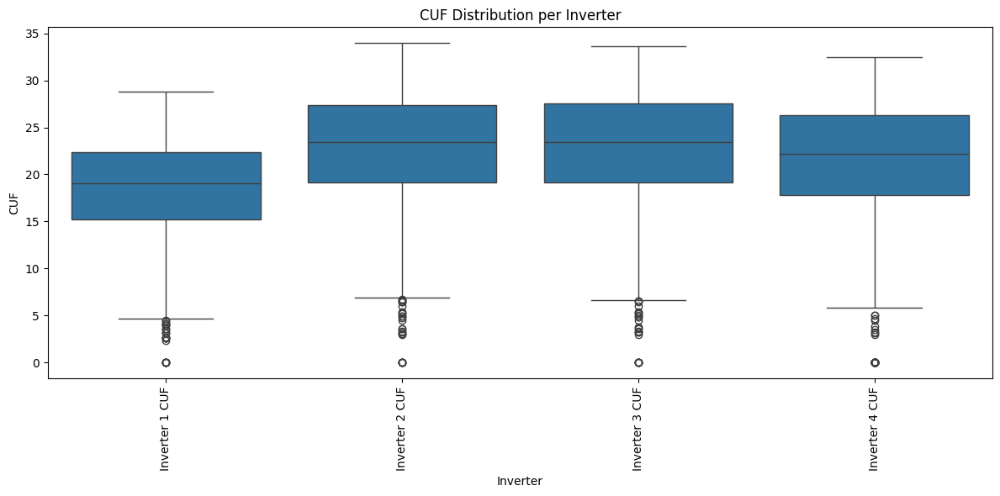

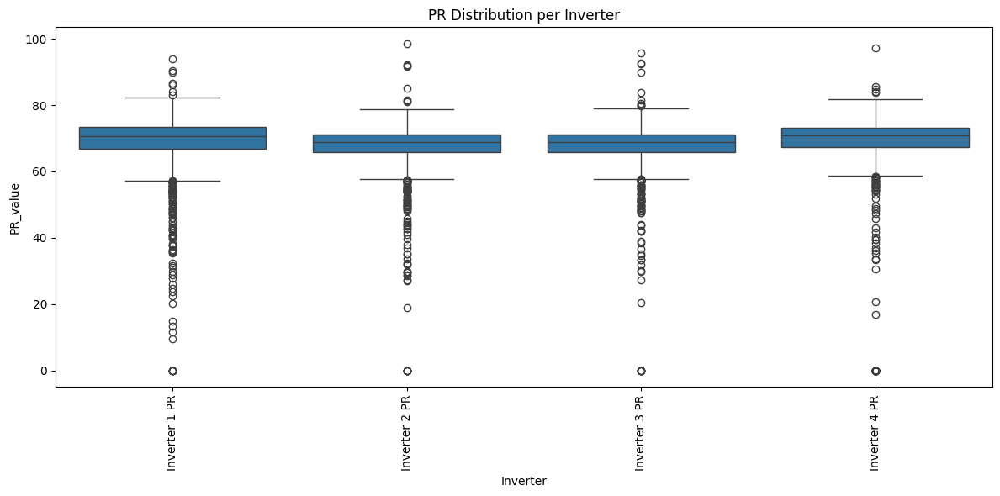

In [ ]:
plot_pr_cuf_distributions(df_pr_ok_4)

# **AND ITS DONE**

# **CLEANING CYCLE OPTIMIZATION**
**1. PSO FUNCTIONS**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_cleaning_effect_combined(pr_cuf_df, cleaning_dates, inverter_list, window=7):
    """
    Analyzes cleaning impact with plots and % change summary for PR and Generation across all inverters.

    Args:
        pr_cuf_df (pd.DataFrame): PR and generation data with 'Date' and relevant inverter columns.
        cleaning_dates (list): List of cleaning dates (as datetime.date or 'YYYY-MM-DD' strings).
        inverter_list (list): List of inverter names e.g., ['Inverter 1', 'Inverter 2', ...]
        window (int): Days before and after cleaning to analyze.

    Returns:
        pd.DataFrame: Combined summary table with % changes for each cleaning date per inverter.
    """

    # Ensure Date column is datetime
    pr_cuf_df["Date"] = pd.to_datetime(pr_cuf_df["Date"], errors='coerce')

    full_summary = []

    for inverter_name in inverter_list:
        pr_col = f"{inverter_name} PR"
        gen_col = f"{inverter_name}"

        if pr_col not in pr_cuf_df.columns or gen_col not in pr_cuf_df.columns:
            print(f"⚠️ Skipping {inverter_name} — PR or Generation column missing.")
            continue

        for clean_date in cleaning_dates:
            clean_date = pd.to_datetime(clean_date).date()

            mask = (pr_cuf_df["Date"].dt.date >= clean_date - pd.Timedelta(days=window)) & \
                   (pr_cuf_df["Date"].dt.date <= clean_date + pd.Timedelta(days=window))

            temp_df = pr_cuf_df.loc[mask].copy()
            temp_df["Day Offset"] = (temp_df["Date"] - pd.Timestamp(clean_date)).dt.days

            pre_mask = temp_df["Day Offset"] < 0
            post_mask = temp_df["Day Offset"] > 0

            pre_pr = temp_df.loc[pre_mask, pr_col].mean()
            post_pr = temp_df.loc[post_mask, pr_col].mean()
            pre_gen = temp_df.loc[pre_mask, gen_col].mean()
            post_gen = temp_df.loc[post_mask, gen_col].mean()

            pr_change = ((post_pr - pre_pr) / pre_pr) * 100 if pre_pr != 0 else np.nan
            gen_change = ((post_gen - pre_gen) / pre_gen) * 100 if pre_gen != 0 else np.nan

            full_summary.append({
                "Inverter": inverter_name,
                "Cleaning Date": clean_date,
                "Pre-PR": round(pre_pr, 2),
                "Post-PR": round(post_pr, 2),
                "% PR Change": round(pr_change, 2),
                "Pre-Gen (kWh)": round(pre_gen, 2),
                "Post-Gen (kWh)": round(post_gen, 2),
                "% Gen Change": round(gen_change, 2)
            })

            # Optional: Plot trends
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))
            fig.suptitle(f"{inverter_name} - Cleaning Impact (Date: {clean_date})", fontsize=14)

            sns.lineplot(data=temp_df, x="Day Offset", y=pr_col, marker="o", ax=axes[0])
            axes[0].axvline(0, color='red', linestyle='--', label='Cleaning Day')
            axes[0].set_title("PR Trend")
            axes[0].legend()

            sns.lineplot(data=temp_df, x="Day Offset", y=gen_col, marker="o", ax=axes[1])
            axes[1].axvline(0, color='red', linestyle='--', label='Cleaning Day')
            axes[1].set_title("Generation Trend (kWh)")
            axes[1].legend()

            plt.tight_layout()
            plt.show()

    # Final Summary Table
    summary_df = pd.DataFrame(full_summary)
    print("\n📝 Combined Cleaning Impact Summary:")
    display(summary_df)

    return summary_df
'''
✔ For each cleaning date:

PR and Generation plotted around the cleaning window

% improvement in PR and Generation calculated
✔ Final summary table with:

Pre & Post PR

Pre & Post Generation

% Change for both
'''

'\n✔ For each cleaning date:\n\nPR and Generation plotted around the cleaning window\n\n% improvement in PR and Generation calculated\n✔ Final summary table with:\n\nPre & Post PR\n\nPre & Post Generation\n\n% Change for both\n'

In [ ]:
!pip install pyswarms

In [ ]:
import numpy as np
import pandas as pd
from pyswarms.single.global_best import GlobalBestPSO
import re

# --- Detection Logic Function ---
def cleaning_detection_score(params, pr_df, inverter_num, known_cleanings):
    """
    Vectorized PSO scoring function. Measures how well a jump in PR matches known cleaning dates.
    """
    n_particles = params.shape[0]
    scores = np.full(n_particles, -1e6)  # default bad score

    pr_col = f"Inverter {inverter_num} PR"
    if pr_col not in pr_df.columns:
        return scores

    df = pr_df[["Date", pr_col]].copy()
    df["Date"] = pd.to_datetime(df["Date"])
    df = df[df[pr_col] > 20].copy()  # skip low PR values

    if df.empty:
        return scores

    for i in range(n_particles):
        jump_threshold, rolling_window, sustain_days = params[i]
        jump_threshold = float(jump_threshold)
        rolling_window = int(round(rolling_window))
        sustain_days = int(round(sustain_days))

        if not (2 <= rolling_window <= 7 and 1 <= sustain_days <= 5):
            continue  # constraints violation

        df["PR Smoothed"] = df[pr_col].rolling(rolling_window, center=True, min_periods=1).mean()
        df["PR Diff"] = df["PR Smoothed"].diff()

        detected_cleanings = []
        for idx in range(1, len(df) - sustain_days):
            jump = df.iloc[idx]["PR Diff"]
            if jump >= jump_threshold:
                sustained = all(df.iloc[idx + j][pr_col] >= df.iloc[idx - 1][pr_col] for j in range(1, sustain_days + 1))
                if sustained:
                    detected_cleanings.append(df.iloc[idx]["Date"].date())

        if not detected_cleanings:
            continue

        score = 0
        for true_clean in known_cleanings:
            matches = [d for d in detected_cleanings if abs((pd.to_datetime(d) - pd.to_datetime(true_clean)).days) <= 2]
            if matches:
                score += 1

        false_positives = len(detected_cleanings) - score
        score -= false_positives * 0.5

        scores[i] = score

    return scores


# --- PSO Runner Function ---
def run_pso_all_inverters(pr_df, known_cleanings, verbose=True):
    """
    Runs PSO for all inverters based on available PR columns.
    """
    # Detect inverter PR columns
    pr_cols = [col for col in pr_df.columns if re.match(r"Inverter\s*\d+\s*PR", col)]

    # Extract normalized inverter names like "Inverter 1", "Inverter 2"
    inverter_list = [col.replace(" PR", "") for col in pr_cols]

    results = []

    for inverter_name in inverter_list:
        inverter_num_match = re.search(r'\d+', inverter_name)
        if not inverter_num_match:
            continue

        inverter_num = inverter_num_match.group()

        options = {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
        bounds = ([0.5, 2, 1], [5, 7, 5])

        optimizer = GlobalBestPSO(n_particles=10, dimensions=3, options=options, bounds=bounds)

        best_cost, best_pos = optimizer.optimize(
            cleaning_detection_score, iters=20,
            pr_df=pr_df, inverter_num=inverter_num, known_cleanings=known_cleanings
        )

        detected_count = max(0, int(best_cost)) if best_cost > -1000 else 0

        results.append({
            "Inverter": inverter_name,
            "Detected Cleanings": detected_count,
            "Score": round(best_cost, 2)
        })

    summary_df = pd.DataFrame(results)

    if verbose:
        print("\n📝 Cleaning Detection Summary:")
        print(summary_df)

    return summary_df

In [ ]:
import pandas as pd

def suggest_cleaning_all_inverters(pr_df, inverter_list, threshold_drop=5, consecutive_days=3):
    """
    Suggests next cleaning date for each inverter based on PR or Generation drop.

    Args:
        pr_df (pd.DataFrame): Data with 'Date', PR and generation columns.
        inverter_list (list): List of inverter names as 'Inverter 1', 'Inverter 2', etc.
        threshold_drop (float): % drop from max after which cleaning is considered.
        consecutive_days (int): No. of consecutive days drop should persist to trigger suggestion.

    Returns:
        pd.DataFrame: Summary of suggested cleaning dates.
    """

    pr_df["Date"] = pd.to_datetime(pr_df["Date"])
    summary = []

    for inverter in inverter_list:
        pr_col = f"{inverter} PR"
        gen_col = f"{inverter}"

        if pr_col not in pr_df.columns or gen_col not in pr_df.columns:
            print(f"⚠️ Skipping {inverter} - data missing.")
            continue

        df = pr_df[["Date", pr_col, gen_col]].copy().sort_values("Date").reset_index(drop=True)

        # Remove invalid or missing values
        df = df.dropna(subset=[pr_col, gen_col])

        if df.empty:
            summary.append({
                "Inverter": inverter,
                "Suggested Cleaning Date": "No Data"
            })
            continue

        pr_max = df[pr_col].max()
        gen_max = df[gen_col].max()

        pr_threshold = pr_max * (1 - threshold_drop / 100)
        gen_threshold = gen_max * (1 - threshold_drop / 100)

        df["PR Low"] = df[pr_col] < pr_threshold
        df["Gen Low"] = df[gen_col] < gen_threshold
        df["Low"] = df["PR Low"] | df["Gen Low"]
        df["Low Streak"] = df["Low"].rolling(consecutive_days).sum()

        suggestion = df[df["Low Streak"] >= consecutive_days]

        if not suggestion.empty:
            suggest_date = suggestion.iloc[0]["Date"].date()
        else:
            suggest_date = "No Immediate Cleaning Needed"

        summary.append({
            "Inverter": inverter,
            "Suggested Cleaning Date": suggest_date
        })

    result_df = pd.DataFrame(summary)
    print("\n📋 Cleaning Suggestion Summary:")
    display(result_df)

    return result_df


In [ ]:
import re

def extract_inverter_data(df):
    """
    Extracts inverter energy columns (varied formats), their corresponding 'Inverter X PR' columns,
    POA Energy, Date, and DayIndex from the input DataFrame.

    Also returns a normalized list of inverter names like 'Inverter 1', 'Inverter 2', etc.

    Args:
        df (pd.DataFrame): Raw solar plant data.

    Returns:
        filtered_df (pd.DataFrame): Filtered DataFrame with Date, DayIndex, POA, inverter energy, PR.
        inverter_list (list): List of standardized inverter names like 'Inverter 1', ...
    """
    df = df.copy()
    df.columns = df.columns.astype(str)

    # --- Always keep these
    keep_cols = ['Date', 'DayIndex']
    poa_cols = [col for col in df.columns if col.strip().lower() == 'poa energy']
    keep_cols += poa_cols

    inverter_energy_cols = []
    inverter_list = []

    # Match columns like 'INV 1', 'Inverter-2', 'Inverter 3'
    for col in df.columns:
        match = re.match(r'^(inv|inverter)[\s\-]*([0-9]+)$', col.strip(), re.IGNORECASE)
        if match:
            inv_num = match.group(2)
            standard_inv_name = f'Inverter {inv_num}'  # standard format
            inverter_energy_cols.append(col)
            inverter_list.append(standard_inv_name)

    # --- Match corresponding PR columns (assumes PR always in "Inverter X PR")
    inverter_pr_cols = [f'{inv} PR' for inv in inverter_list if f'{inv} PR' in df.columns]

    # --- Combine columns
    selected_cols = list(set(keep_cols + inverter_energy_cols + inverter_pr_cols))

    return df[selected_cols], inverter_list

# **DATA CLEANING & PSO Results**

In [ ]:
import pandas as pd
# Define the file path
file_path_w = '/content/drive/My Drive/FPE Data/LOG BOOKS/DMART WARDHA/combined_with_PR_CUF.xlsx'
file_path_d = '/content/drive/My Drive/FPE Data/LOG BOOKS/DMART DOMBIVALI/combined_with_PR_CUF.xlsx'
file_path_n = '/content/drive/My Drive/FPE Data/LOG BOOKS/NER/combined_with_PR_CUF.xlsx'
file_path_a = '/content/drive/My Drive/FPE Data/LOG BOOKS/DMART ADGAON/combined_with_PR_CUF.xlsx'
df_w = pd.read_excel(file_path_w)
df_d = pd.read_excel(file_path_d)
df_n = pd.read_excel(file_path_n)
df_a = pd.read_excel(file_path_a)
#filtered_df_w, inv_w = extract_inverter_data(df_w)
filtered_df_d, inv_d = extract_inverter_data(df_d)
#filtered_df_n, inv_n = extract_inverter_data(df_n)
#filtered_df_a, inv_a = extract_inverter_data(df_a)
# Preview the result
#display(filtered_df_d.head())

In [ ]:
from datetime import datetime

# Cleaning Dates - Dombivli
cleaning_dates_dombivli = [
    # 2025
    "2025-06-10", "2025-06-15", "2025-06-25", "2025-06-28", "2025-06-29",
    "2025-05-13", "2025-05-17", "2025-05-22", "2025-05-23", "2025-05-29",
    "2025-04-03", "2025-04-07", "2025-04-12", "2025-04-14", "2025-04-19", "2025-04-24", "2025-04-26",
    "2025-03-04", "2025-03-06", "2025-03-13", "2025-03-15", "2025-03-21", "2025-03-26",
    "2025-02-05", "2025-02-03", "2025-02-04", "2025-02-11", "2025-02-12", "2025-02-18", "2025-02-20", "2025-02-21",
    "2025-02-25", "2025-02-26", "2025-02-27",
    "2025-01-06", "2025-01-14", "2025-01-15", "2025-01-16", "2025-01-20", "2025-01-21", "2025-01-22", "2025-01-29",

    # 2024
    "2024-01-05", "2024-01-09", "2024-01-18", "2024-01-29",
    "2024-02-02", "2024-02-07", "2024-02-09", "2024-02-17", "2024-02-20", "2024-02-24", "2024-02-27",
    "2024-03-02", "2024-03-19",
    "2024-04-02", "2024-04-13", "2024-04-19", "2024-04-28",
    "2024-05-07", "2024-05-15", "2024-05-16", "2024-05-27",
    "2024-06-14", "2024-06-17", "2024-06-18", "2024-06-19", "2024-06-25", "2024-06-26",
    "2024-07-03", "2024-07-05", "2024-07-09", "2024-07-17", "2024-07-28",
    "2024-08-09", "2024-08-14", "2024-08-23",
    "2024-09-20",
    "2024-10-05", "2024-10-22", "2024-10-29",
    "2024-11-15", "2024-11-28", "2024-11-29",
    "2024-12-03", "2024-12-04", "2024-12-06", "2024-12-18", "2024-12-19", "2024-12-24", "2024-12-25", "2024-12-31",

    # 2023
    "2023-05-27", "2023-05-31",
    "2023-06-05", "2023-06-06", "2023-06-07", "2023-06-17", "2023-06-19", "2023-06-29",
    "2023-07-13", "2023-07-25",
    "2023-08-14", "2023-08-23",
    "2023-09-08", "2023-09-13", "2023-09-15", "2023-09-16", "2023-09-28",
    "2023-10-15", "2023-10-16", "2023-10-31",
    "2023-11-10", "2023-11-20", "2023-11-21", "2023-11-30",
    "2023-12-14", "2023-12-30"
]

# Maintenance Dates - Dombivli
maintenance_dates_dombivli = [
    "2023-07-12", "2023-09-20", "2023-09-21", "2023-09-23",
    "2024-05-10", "2024-08-20", "2024-11-20",
    "2025-02-06", "2025-06-04"
]

# Optional: convert to datetime.date objects if needed
cleaning_dates_dombivli = [datetime.strptime(d, "%Y-%m-%d").date() for d in cleaning_dates_dombivli]
maintenance_dates_dombivli = [datetime.strptime(d, "%Y-%m-%d").date() for d in maintenance_dates_dombivli]

In [ ]:
def add_cleaning_maintenance_flags(df, cleaning_dates, maintenance_dates):
    """
    Adds cleaning and maintenance flags to the DataFrame,
    filters early dates, and reports dropped dates cleanly.

    Args:
        df (pd.DataFrame): Must include 'Date' column.
        cleaning_dates (list of datetime.date): Cleaning dates.
        maintenance_dates (list of datetime.date): Maintenance dates.

    Returns:
        pd.DataFrame: Filtered DataFrame with flags.
    """

    # --- Safe copy
    df = df.copy()

    # --- Ensure 'Date' is datetime
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df['Date_only'] = df['Date'].dt.date

    # --- Determine minimum valid flag date
    cutoff_date = min(min(cleaning_dates), min(maintenance_dates))
    print(f"📅 Data filtered to dates on or after: {cutoff_date}")

    # --- Filter out rows before earliest flag
    df = df[df['Date_only'] >= cutoff_date].copy()

    # --- Add flags
    df['Cleaning_Flag'] = df['Date_only'].isin(cleaning_dates).astype(int)
    df['Maintenance_Flag'] = df['Date_only'].isin(maintenance_dates).astype(int)

    # --- Count how many flag dates matched
    used_cleaning = df['Cleaning_Flag'].sum()
    used_maintenance = df['Maintenance_Flag'].sum()

    total_cleaning = len(cleaning_dates)
    total_maintenance = len(maintenance_dates)

    dropped_cleaning = total_cleaning - used_cleaning
    dropped_maintenance = total_maintenance - used_maintenance

    # --- Report
    print(f"📉 {dropped_cleaning} cleaning date(s) and {dropped_maintenance} maintenance date(s) "
          f"were dropped due to missing or early data.")
    print(f"✅ {used_cleaning} cleaning date(s) and {used_maintenance} maintenance date(s) remain in the dataset.")

    # --- Cleanup
    df.drop(columns=["Date_only"], inplace=True)

    return df

In [ ]:
filtered_df_d = add_cleaning_maintenance_flags(
    df=filtered_df_d,
    cleaning_dates=cleaning_dates_dombivli,
    maintenance_dates=maintenance_dates_dombivli
)

📅 Data filtered to dates on or after: 2023-05-27
📉 0 cleaning date(s) and 0 maintenance date(s) were dropped due to missing or early data.
✅ 118 cleaning date(s) and 9 maintenance date(s) remain in the dataset.


In [ ]:
from datetime import date

wardha_cleaning_dates = [
    # 2025
    date(2025, 6, 6), date(2025, 6, 13), date(2025, 6, 20),
    date(2025, 5, 9), date(2025, 5, 16), date(2025, 5, 21), date(2025, 5, 29),
    date(2025, 4, 10), date(2025, 4, 18), date(2025, 4, 24),
    date(2025, 3, 7), date(2025, 3, 15), date(2025, 3, 19),
    date(2025, 2, 6), date(2025, 2, 21),
    date(2025, 1, 4), date(2025, 1, 16), date(2025, 1, 23),

    # 2024
    date(2024, 1, 5), date(2024, 1, 18), date(2024, 1, 25),
    date(2024, 2, 8), date(2024, 2, 17), date(2024, 2, 29),
    date(2024, 3, 6), date(2024, 3, 14), date(2024, 3, 21), date(2024, 3, 27),
    date(2024, 4, 7), date(2024, 4, 13), date(2024, 4, 20), date(2024, 4, 28),
    date(2024, 5, 4), date(2024, 5, 12), date(2024, 5, 27), date(2024, 5, 28),
    date(2024, 6, 8), date(2024, 6, 22),
    date(2024, 7, 22), date(2024, 7, 27),
    date(2024, 8, 7), date(2024, 8, 22),
    date(2024, 9, 4), date(2024, 9, 18),
    date(2024, 10, 12), date(2024, 10, 19), date(2024, 10, 26),
    date(2024, 11, 6), date(2024, 11, 15), date(2024, 11, 20),
    date(2024, 12, 5), date(2024, 12, 11), date(2024, 12, 18),

    # 2023
    date(2023, 5, 21), date(2023, 5, 26),
    date(2023, 6, 7), date(2023, 6, 16), date(2023, 6, 30),
    date(2023, 7, 14), date(2023, 7, 27),
    date(2023, 8, 11), date(2023, 8, 21), date(2023, 8, 29),
    date(2023, 9, 13), date(2023, 9, 27),
    date(2023, 10, 6), date(2023, 10, 19), date(2023, 10, 29),
    date(2023, 11, 10), date(2023, 11, 18), date(2023, 11, 28),
    date(2023, 12, 10), date(2023, 12, 16), date(2023, 12, 28),
]
wardha_maintenance_dates = [
    date(2025, 4, 3), date(2025, 2, 14),
    date(2024, 2, 16), date(2024, 5, 24), date(2024, 8, 12), date(2024, 11, 12),
    date(2023, 6, 2), date(2023, 6, 12), date(2023, 7, 7), date(2023, 8, 5), date(2023, 11, 15),
]

In [ ]:
filtered_df_w = add_cleaning_maintenance_flags(
    df=filtered_df_w,
    cleaning_dates=wardha_cleaning_dates,
    maintenance_dates=wardha_maintenance_dates
)

📅 Data filtered to dates on or after: 2023-05-21
📉 0 cleaning date(s) and 0 maintenance date(s) were dropped due to missing or early data.
✅ 74 cleaning date(s) and 11 maintenance date(s) remain in the dataset.


In [ ]:
display(filtered_df_w.columns)

Index(['Inverter 2', 'Inverter 2 PR', 'Date', 'Inverter 4', 'Inverter 1 PR',
       'Inverter 1', 'POA Energy', 'Inverter 4 PR', 'Inverter 3', 'DayIndex',
       'Inverter 3 PR', 'Cleaning_Flag', 'Maintenance_Flag'],
      dtype='object')

In [ ]:
ner_cleaning_dates = [
    date(2024, 9, 30), date(2024, 10, 7), date(2024, 10, 14), date(2024, 10, 21), date(2024, 10, 26),
    date(2024, 11, 5), date(2024, 11, 10), date(2024, 11, 16), date(2024, 11, 25),
    date(2024, 12, 4), date(2024, 12, 10), date(2024, 12, 19), date(2024, 12, 27),
    date(2025, 1, 3), date(2025, 1, 10), date(2025, 1, 20), date(2025, 1, 27),
    date(2025, 2, 5), date(2025, 2, 12), date(2025, 2, 25),
    date(2025, 3, 13),
    date(2025, 4, 24),
    date(2025, 5, 4), date(2025, 5, 9), date(2025, 5, 20), date(2025, 5, 27),
    date(2025, 6, 2), date(2025, 6, 10), date(2025, 6, 21), date(2025, 6, 26),
]
ner_maintenance_dates = [
    date(2024, 10, 16),
    date(2024, 12, 12), date(2024, 12, 13),
    date(2025, 6, 20)
]
filtered_df_n = add_cleaning_maintenance_flags(filtered_df_n, ner_cleaning_dates, ner_maintenance_dates)

📅 Data filtered to dates on or after: 2024-09-30
📉 0 cleaning date(s) and 0 maintenance date(s) were dropped due to missing or early data.
✅ 30 cleaning date(s) and 4 maintenance date(s) remain in the dataset.


In [ ]:
adgaon_cleaning_dates = [
    # 2023
    date(2023, 5, 22), date(2023, 5, 28), date(2023, 6, 8), date(2023, 6, 18), date(2023, 6, 30),
    date(2023, 7, 9), date(2023, 7, 24), date(2023, 8, 13), date(2023, 8, 30), date(2023, 9, 13),
    date(2023, 9, 26), date(2023, 10, 9), date(2023, 10, 18), date(2023, 10, 22),
    date(2023, 11, 8), date(2023, 11, 18), date(2023, 11, 25),
    date(2023, 12, 9), date(2023, 12, 15), date(2023, 12, 22),

    # 2024
    date(2024, 1, 7), date(2024, 1, 18), date(2024, 1, 28), date(2024, 2, 4), date(2024, 2, 16),
    date(2024, 2, 26), date(2024, 3, 3), date(2024, 3, 12), date(2024, 3, 18), date(2024, 3, 24),
    date(2024, 4, 8), date(2024, 4, 15), date(2024, 4, 23), date(2024, 4, 28),
    date(2024, 5, 5), date(2024, 5, 19), date(2024, 5, 26), date(2024, 5, 28),
    date(2024, 6, 10), date(2024, 6, 23), date(2024, 6, 27),
    date(2024, 7, 20), date(2024, 7, 28), date(2024, 8, 8), date(2024, 8, 13), date(2024, 8, 21),
    date(2024, 9, 23), date(2024, 10, 4), date(2024, 10, 17), date(2024, 11, 4), date(2024, 11, 12),
    date(2024, 11, 22), date(2024, 11, 27), date(2024, 12, 17), date(2024, 12, 26),

    # 2025
    date(2025, 1, 6), date(2025, 1, 18), date(2025, 1, 29),
    date(2025, 2, 5), date(2025, 2, 15), date(2025, 2, 24),
    date(2025, 3, 3), date(2025, 3, 13), date(2025, 3, 23), date(2025, 3, 28),
    date(2025, 4, 7), date(2025, 4, 16), date(2025, 4, 29),
    date(2025, 5, 7), date(2025, 5, 17), date(2025, 5, 27),
    date(2025, 6, 17), date(2025, 6, 27)
]
adgaon_maintenance_dates = [
    date(2023, 5, 27), date(2023, 8, 20), date(2023, 11, 30),
    date(2024, 3, 31), date(2024, 6, 26), date(2024, 9, 9), date(2024, 12, 6),
    date(2025, 3, 20), date(2025, 6, 7)
]
filtered_df_a = add_cleaning_maintenance_flags(
    filtered_df_a,
    cleaning_dates=adgaon_cleaning_dates,
    maintenance_dates=adgaon_maintenance_dates
)

📅 Data filtered to dates on or after: 2023-05-22
📉 0 cleaning date(s) and 0 maintenance date(s) were dropped due to missing or early data.
✅ 73 cleaning date(s) and 9 maintenance date(s) remain in the dataset.


In [ ]:
pso_summary_ner = run_pso_all_inverters(filtered_df_n, ner_cleaning_dates, inv_n)
display(pso_summary_ner)

2025-07-09 05:36:41,549 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-1e+6
2025-07-09 05:36:55,991 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -1000000.0, best pos: [4.86633246 6.75468405 1.31488887]
2025-07-09 05:36:56,006 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-1e+6
2025-07-09 05:37:08,445 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -1000000.0, best pos: [3.89592364 6.93389522 1.55509607]
2025-07-09 05:37:08,467 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-6.5
2025-07-09 05:37:29,683 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -6.5, best pos: [0.5


📝 Cleaning Detection Summary:
       Inverter  Detected Cleanings      Score
0    Inverter 2                   0 -1000000.0
1    Inverter 5                   0 -1000000.0
2   Inverter 10                   0       -6.5
3   Inverter 12                   0 -1000000.0
4    Inverter 7                   0 -1000000.0
5    Inverter 3                   0 -1000000.0
6   Inverter 11                   0       -6.5
7    Inverter 9                   0 -1000000.0
8    Inverter 6                   0 -1000000.0
9   Inverter 14                   0 -1000000.0
10   Inverter 1                   0 -1000000.0
11   Inverter 8                   0 -1000000.0
12  Inverter 13                   0       -5.0
13   Inverter 4                   0 -1000000.0


,Inverter,Detected Cleanings,Score
0,Inverter 2,0,-1000000.0
1,Inverter 5,0,-1000000.0
2,Inverter 10,0,-6.5
3,Inverter 12,0,-1000000.0
4,Inverter 7,0,-1000000.0
5,Inverter 3,0,-1000000.0
6,Inverter 11,0,-6.5
7,Inverter 9,0,-1000000.0
8,Inverter 6,0,-1000000.0
9,Inverter 14,0,-1000000.0


In [ ]:
pso_summary_domb = run_pso_all_inverters(filtered_df_d, cleaning_dates_dombivli, inv_d)
display(pso_summary_domb)

2025-07-09 05:41:07,621 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-2
2025-07-09 05:41:58,439 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -2.0, best pos: [3.49851166 5.72981683 2.05862808]
2025-07-09 05:41:58,454 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-3.5
2025-07-09 05:43:47,416 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -3.5, best pos: [2.06671554 6.64413793 2.78237587]
2025-07-09 05:43:47,430 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=0
2025-07-09 05:45:23,164 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.0, best pos: [2.27510572 4.68431273 2


📝 Cleaning Detection Summary:
     Inverter  Detected Cleanings  Score
0  Inverter 2                   0   -2.0
1  Inverter 1                   0   -3.5
2  Inverter 6                   0    0.0
3  Inverter 3                   0   -0.5
4  Inverter 7                   0   -3.0
5  Inverter 4                   0   -4.5
6  Inverter 5                   0   -4.0


,Inverter,Detected Cleanings,Score
0,Inverter 2,0,-2.0
1,Inverter 1,0,-3.5
2,Inverter 6,0,0.0
3,Inverter 3,0,-0.5
4,Inverter 7,0,-3.0
5,Inverter 4,0,-4.5
6,Inverter 5,0,-4.0


In [ ]:
pso_summary_w = run_pso_all_inverters(filtered_df_w, wardha_cleaning_dates, inv_w)
display(pso_summary_w)

2025-07-09 05:57:37,127 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=0.5
2025-07-09 05:58:36,205 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.5, best pos: [2.93592482 3.71901526 4.8082537 ]
2025-07-09 05:58:36,217 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-6
2025-07-09 05:59:50,855 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -6.0, best pos: [0.51339287 4.92589772 1.95468555]
2025-07-09 05:59:50,869 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-8.5
2025-07-09 06:00:46,071 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -8.5, best pos: [0.55930336 4.49838049


📝 Cleaning Detection Summary:
     Inverter  Detected Cleanings  Score
0  Inverter 2                   0    0.5
1  Inverter 1                   0   -6.0
2  Inverter 4                   0   -8.5
3  Inverter 3                   0   -1.0


,Inverter,Detected Cleanings,Score
0,Inverter 2,0,0.5
1,Inverter 1,0,-6.0
2,Inverter 4,0,-8.5
3,Inverter 3,0,-1.0


In [ ]:
pso_summary_adg = run_pso_all_inverters(filtered_df_a, adgaon_cleaning_dates, inv_a)
display(pso_summary_adg)

2025-07-09 07:51:46,399 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-1.5
2025-07-09 07:52:40,075 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -1.5, best pos: [3.47435422 2.77747423 2.61642464]
2025-07-09 07:52:40,095 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-5
2025-07-09 07:53:59,971 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -5.0, best pos: [0.60366849 3.40228464 1.38639494]
2025-07-09 07:53:59,984 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.8}
pyswarms.single.global_best: 100%|██████████|20/20, best_cost=-0.5
2025-07-09 07:54:46,758 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -0.5, best pos: [0.66041873 5.001393


📝 Cleaning Detection Summary:
     Inverter  Detected Cleanings      Score
0  Inverter 2                   0       -1.5
1  Inverter 1                   0       -5.0
2  Inverter 4                   0       -0.5
3  Inverter 3                   0 -1000000.0


,Inverter,Detected Cleanings,Score
0,Inverter 2,0,-1.5
1,Inverter 1,0,-5.0
2,Inverter 4,0,-0.5
3,Inverter 3,0,-1000000.0


# **ML BASED MODELS**

In [ ]:
import pandas as pd
import numpy as np
import re
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

def run_forecasting_and_classification(df, inverter_list, n_forecast_days=7, verbose=True):
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df = df.dropna(subset=['Date'])
    df = df.sort_values('Date')

    all_results = []

    for inv in inverter_list:
        pr_col = f"{inv} PR"
        if pr_col not in df.columns:
            if verbose:
                print(f"⚠️ Skipping {inv} — PR column not found.")
            continue

        sub_df = df[['Date', pr_col, 'POA Energy', 'Cleaning_Flag', 'Maintenance_Flag']].copy()
        sub_df = sub_df.dropna(subset=[pr_col])
        sub_df = sub_df.set_index('Date').asfreq('D')

        # --- Holt-Winters Forecast ---
        try:
            model_hw = ExponentialSmoothing(sub_df[pr_col], trend='add', seasonal=None).fit()
            hw_forecast = model_hw.forecast(n_forecast_days)
        except Exception as e:
            hw_forecast = [np.nan]*n_forecast_days
            if verbose: print(f"⚠️ Holt-Winters failed for {inv}: {e}")

        # --- SARIMA Forecast ---
        try:
            model_sarima = SARIMAX(sub_df[pr_col], order=(1,1,1), seasonal_order=(0,0,0,0)).fit(disp=False)
            sarima_forecast = model_sarima.forecast(n_forecast_days)
        except Exception as e:
            sarima_forecast = [np.nan]*n_forecast_days
            if verbose: print(f"⚠️ SARIMA failed for {inv}: {e}")

        # --- Classification: Predict Cleaning_Flag ---
        clf_df = sub_df.dropna().copy()
        clf_df['Target'] = clf_df['Cleaning_Flag'].astype(int)

        # --- Flexible inverter energy column matching
        inv_number = re.findall(r'\d+', inv)
        inv_number = inv_number[0] if inv_number else None
        energy_col_match = None
        if inv_number:
            inv_pattern = re.compile(rf"\b(INV|Inverter)[\s\-_]*X?0*{inv_number}\b", re.IGNORECASE)
            for col in clf_df.columns:
                if inv_pattern.search(col.strip()):
                    energy_col_match = col
                    break

        if not energy_col_match:
            if verbose: print(f"⚠️ Classification failed for {inv}: could not match energy column.")
            rf_acc = xgb_acc = np.nan
        else:
            try:
                clf_features = clf_df[[pr_col, 'POA Energy']].fillna(0)
                clf_target = clf_df['Target']
                X_train, X_test, y_train, y_test = train_test_split(clf_features, clf_target, test_size=0.2, random_state=42)

                # Random Forest
                rf = RandomForestClassifier(n_estimators=100)
                rf.fit(X_train, y_train)
                rf_preds = rf.predict(X_test)
                rf_acc = accuracy_score(y_test, rf_preds)

                # XGBoost
                xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
                xgb.fit(X_train, y_train)
                xgb_preds = xgb.predict(X_test)
                xgb_acc = accuracy_score(y_test, xgb_preds)
            except Exception as e:
                rf_acc = xgb_acc = np.nan
                if verbose: print(f"⚠️ Classification failed for {inv}: {e}")

        all_results.append({
            'Inverter': inv,
            'HW_Prediction': hw_forecast,
            'SARIMA_Prediction': sarima_forecast,
            'RF_Acc': rf_acc,
            'XGB_Acc': xgb_acc
        })

    result_df = pd.DataFrame(all_results)
    return result_df

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np

def calc_rmse(preds, actuals):
    preds = np.array(preds)
    actuals = np.array(actuals)
    mask = ~np.isnan(preds) & ~np.isnan(actuals)
    return np.sqrt(mean_squared_error(actuals[mask], preds[mask])) if mask.any() else np.nan

comparison_df['HW_RMSE'] = comparison_df.apply(lambda row: calc_rmse(row['HW_Predictions'], row['Actuals']), axis=1)
comparison_df['SARIMA_RMSE'] = comparison_df.apply(lambda row: calc_rmse(row['SARIMA_Predictions'], row['Actuals']), axis=1)


In [ ]:
display(comparison_df)

,Inverter,HW_Predictions,SARIMA_Predictions,Actuals,HW_RMSE,SARIMA_RMSE
0,Inverter 1,2025-06-24 75.119971 2025-06-25 75.12535...,2025-06-24 74.133697 2025-06-25 72.24193...,"[77.33818803097184, 75.06334902181455, 76.8530...",4.858652,4.724036
1,Inverter 2,2025-06-24 74.951348 2025-06-25 74.94648...,2025-06-24 74.230941 2025-06-25 72.54205...,"[76.65324188376879, 75.6197876009457, 74.71775...",1.131952,3.134719
2,Inverter 3,2025-06-24 77.414647 2025-06-25 77.41656...,2025-06-24 75.645018 2025-06-25 73.72078...,"[79.28274349610817, 77.34471685797158, 79.3581...",1.501877,4.284594
3,Inverter 4,2025-06-24 78.143880 2025-06-25 78.14222...,2025-06-24 76.819862 2025-06-25 74.93470...,"[79.41110753672906, 77.07801671268955, 79.2081...",1.720727,3.301481
4,Inverter 5,2025-06-24 76.825211 2025-06-25 76.82223...,2025-06-24 76.411553 2025-06-25 75.30862...,"[79.04501854144624, 78.25491824904545, 78.8909...",1.708839,2.569504
5,Inverter 6,2025-06-24 NaN 2025-06-25 NaN 2025-06-26 ...,2025-06-24 80.508598 2025-06-25 80.04269...,"[80.84002524013295, 79.97554598109056, 80.0079...",NaN,1.877807
6,Inverter 7,2025-06-24 79.727977 2025-06-25 79.72523...,2025-06-24 77.235827 2025-06-25 75.32818...,"[80.7453151377949, 80.68233364977118, 79.54503...",1.856297,4.451437


In [ ]:
result_summary_df = run_forecasting_and_classification(filtered_df_d, inv_d)
pd.set_option('display.max_colwidth', None)
display(result_summary_df)

,Inverter,HW_Prediction,SARIMA_Prediction,RF_Acc,XGB_Acc
0,Inverter 1,"2025-07-01 72.640871 2025-07-02 72.642954 2025-07-03 72.645036 2025-07-04 72.647119 2025-07-05 72.649201 2025-07-06 72.651284 2025-07-07 72.653366 Freq: D, dtype: float64","2025-07-01 72.558993 2025-07-02 71.936595 2025-07-03 71.689783 2025-07-04 71.591909 2025-07-05 71.553097 2025-07-06 71.537707 2025-07-07 71.531603 Freq: D, Name: predicted_mean, dtype: float64",0.837662,0.811688
1,Inverter 2,"2025-07-01 74.846142 2025-07-02 74.841187 2025-07-03 74.836231 2025-07-04 74.831275 2025-07-05 74.826320 2025-07-06 74.821364 2025-07-07 74.816408 Freq: D, dtype: float64","2025-07-01 73.065721 2025-07-02 72.204061 2025-07-03 71.862472 2025-07-04 71.727055 2025-07-05 71.673372 2025-07-06 71.652090 2025-07-07 71.643653 Freq: D, Name: predicted_mean, dtype: float64",0.818182,0.818182
2,Inverter 3,"2025-07-01 76.908308 2025-07-02 76.909594 2025-07-03 76.910879 2025-07-04 76.912164 2025-07-05 76.913449 2025-07-06 76.914735 2025-07-07 76.916020 Freq: D, dtype: float64","2025-07-01 74.730123 2025-07-02 73.845146 2025-07-03 73.507173 2025-07-04 73.378101 2025-07-05 73.328809 2025-07-06 73.309984 2025-07-07 73.302795 Freq: D, Name: predicted_mean, dtype: float64",0.831169,0.805195
3,Inverter 4,"2025-07-01 76.772258 2025-07-02 76.768849 2025-07-03 76.765440 2025-07-04 76.762031 2025-07-05 76.758621 2025-07-06 76.755212 2025-07-07 76.751803 Freq: D, dtype: float64","2025-07-01 75.611904 2025-07-02 74.940545 2025-07-03 74.646077 2025-07-04 74.516920 2025-07-05 74.460269 2025-07-06 74.435422 2025-07-07 74.424523 Freq: D, Name: predicted_mean, dtype: float64",0.844156,0.772727
4,Inverter 5,"2025-07-01 76.641116 2025-07-02 76.637912 2025-07-03 76.634708 2025-07-04 76.631505 2025-07-05 76.628301 2025-07-06 76.625097 2025-07-07 76.621894 Freq: D, dtype: float64","2025-07-01 75.827801 2025-07-02 75.591821 2025-07-03 75.510848 2025-07-04 75.483063 2025-07-05 75.473529 2025-07-06 75.470258 2025-07-07 75.469135 Freq: D, Name: predicted_mean, dtype: float64",0.837662,0.824675
5,Inverter 6,"2025-07-01 NaN 2025-07-02 NaN 2025-07-03 NaN 2025-07-04 NaN 2025-07-05 NaN 2025-07-06 NaN 2025-07-07 NaN Freq: D, dtype: float64","2025-07-01 78.231629 2025-07-02 78.226892 2025-07-03 78.225224 2025-07-04 78.224636 2025-07-05 78.224429 2025-07-06 78.224356 2025-07-07 78.224331 Freq: D, Name: predicted_mean, dtype: float64",0.810458,0.758170
6,Inverter 7,"2025-07-01 78.459049 2025-07-02 78.454932 2025-07-03 78.450814 2025-07-04 78.446697 2025-07-05 78.442579 2025-07-06 78.438462 2025-07-07 78.434344 Freq: D, dtype: float64","2025-07-01 76.139155 2025-07-02 74.884092 2025-07-03 74.325625 2025-07-04 74.077124 2025-07-05 73.966548 2025-07-06 73.917345 2025-07-07 73.895451 Freq: D, Name: predicted_mean, dtype: float64",0.818182,0.811688


In [ ]:
import pandas as pd
import numpy as np
import re
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

def run_forecasting_and_classification_2(df, inverter_list, n_forecast_days=7, verbose=True):
    def safe_rmse(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        mask = ~np.isnan(y_true) & ~np.isnan(y_pred)
        return np.sqrt(np.mean((y_true[mask] - y_pred[mask])**2)) if mask.any() else np.nan

    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df = df.dropna(subset=['Date'])
    df = df.sort_values('Date')

    cutoff_date = df['Date'].max() - pd.Timedelta(days=n_forecast_days)
    train_df = df[df['Date'] <= cutoff_date]
    val_df = df[df['Date'] > cutoff_date]

    all_results = []

    for inv in inverter_list:
        pr_col = f"{inv} PR"
        if pr_col not in df.columns:
            if verbose:
                print(f"⚠️ Skipping {inv} — PR column not found.")
            continue

        sub_df = train_df[['Date', pr_col, 'POA Energy', 'Cleaning_Flag', 'Maintenance_Flag']].copy()
        sub_df = sub_df.dropna(subset=[pr_col])
        sub_df = sub_df.set_index('Date').asfreq('D')

        # --- Holt-Winters Forecast ---
        try:
            model_hw = ExponentialSmoothing(sub_df[pr_col], trend='add', seasonal=None).fit()
            hw_forecast = model_hw.forecast(n_forecast_days)
        except Exception as e:
            hw_forecast = pd.Series([np.nan]*n_forecast_days)
            if verbose: print(f"⚠️ Holt-Winters failed for {inv}: {e}")

        # --- SARIMA Forecast ---
        try:
            model_sarima = SARIMAX(sub_df[pr_col], order=(1,1,1), seasonal_order=(0,0,0,0)).fit(disp=False)
            sarima_forecast = model_sarima.forecast(n_forecast_days)
        except Exception as e:
            sarima_forecast = pd.Series([np.nan]*n_forecast_days)
            if verbose: print(f"⚠️ SARIMA failed for {inv}: {e}")

        # --- Actuals from validation set ---
        actuals_df = val_df[['Date', pr_col]].dropna().set_index('Date').asfreq('D')
        actual_vals = actuals_df[pr_col].iloc[:n_forecast_days].values if pr_col in actuals_df.columns else [np.nan]*n_forecast_days

        # --- Error calculation ---
        hw_rmse = safe_rmse(actual_vals, hw_forecast)
        sarima_rmse = safe_rmse(actual_vals, sarima_forecast)

        # --- Classification: Predict Cleaning_Flag ---
        clf_df = sub_df.dropna().copy()
        clf_df['Target'] = clf_df['Cleaning_Flag'].astype(int)

        # --- Flexible inverter energy column matching
        inv_number = re.findall(r'\d+', inv)
        inv_number = inv_number[0] if inv_number else None
        energy_col_match = None
        if inv_number:
            inv_pattern = re.compile(rf"\b(INV|Inverter)[\s\-_]*X?0*{inv_number}\b", re.IGNORECASE)
            for col in clf_df.columns:
                if inv_pattern.search(col.strip()):
                    energy_col_match = col
                    break

        if not energy_col_match:
            if verbose: print(f"⚠️ Classification failed for {inv}: could not match energy column.")
            rf_acc = xgb_acc = np.nan
        else:
            try:
                clf_features = clf_df[[pr_col, 'POA Energy']].fillna(0)
                clf_target = clf_df['Target']
                X_train, X_test, y_train, y_test = train_test_split(clf_features, clf_target, test_size=0.2, random_state=42)

                # Random Forest
                rf = RandomForestClassifier(n_estimators=100)
                rf.fit(X_train, y_train)
                rf_preds = rf.predict(X_test)
                rf_acc = accuracy_score(y_test, rf_preds)

                # XGBoost
                xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
                xgb.fit(X_train, y_train)
                xgb_preds = xgb.predict(X_test)
                xgb_acc = accuracy_score(y_test, xgb_preds)
            except Exception as e:
                rf_acc = xgb_acc = np.nan
                if verbose: print(f"⚠️ Classification failed for {inv}: {e}")

        all_results.append({
            'Inverter': inv,
            'HW_Prediction': hw_forecast,
            'SARIMA_Prediction': sarima_forecast,
            'Actuals': actual_vals,
            'HW_RMSE': hw_rmse,
            'SARIMA_RMSE': sarima_rmse,
            'RF_Acc': rf_acc,
            'XGB_Acc': xgb_acc
        })

    result_df = pd.DataFrame(all_results)
    return result_df

In [ ]:
result_summary_df_2 = run_forecasting_and_classification_2(filtered_df_d, inv_d)
pd.set_option('display.max_colwidth', None)
display(result_summary_df_2)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [05:27:10] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [05:27:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [05:27:14]

,Inverter,HW_Prediction,SARIMA_Prediction,Actuals,HW_RMSE,SARIMA_RMSE,RF_Acc,XGB_Acc
0,Inverter 1,"2025-06-24 75.119971 2025-06-25 75.125355 2025-06-26 75.130740 2025-06-27 75.136124 2025-06-28 75.141509 2025-06-29 75.146893 2025-06-30 75.152278 Freq: D, dtype: float64","2025-06-24 74.133697 2025-06-25 72.241933 2025-06-26 71.487546 2025-06-27 71.186715 2025-06-28 71.066752 2025-06-29 71.018913 2025-06-30 70.999836 Freq: D, Name: predicted_mean, dtype: float64","[77.33818803097184, 75.06334902181455, 76.8530132139794, 76.15165265776692, 73.66845216610209, 62.77330435538131, 74.12852256598298]",4.858652,4.724036,0.842105,0.822368
1,Inverter 2,"2025-06-24 74.951348 2025-06-25 74.946489 2025-06-26 74.941630 2025-06-27 74.936770 2025-06-28 74.931911 2025-06-29 74.927051 2025-06-30 74.922192 Freq: D, dtype: float64","2025-06-24 74.230941 2025-06-25 72.542057 2025-06-26 71.875261 2025-06-27 71.612000 2025-06-28 71.508061 2025-06-29 71.467024 2025-06-30 71.450822 Freq: D, Name: predicted_mean, dtype: float64","[76.65324188376879, 75.6197876009457, 74.71775243861339, 76.21414802682412, 73.13463888184651, 74.14801419333634, 75.23926132645462]",1.131952,3.134719,0.828947,0.815789
2,Inverter 3,"2025-06-24 77.414647 2025-06-25 77.416561 2025-06-26 77.418475 2025-06-27 77.420389 2025-06-28 77.422303 2025-06-29 77.424217 2025-06-30 77.426131 Freq: D, dtype: float64","2025-06-24 75.645018 2025-06-25 73.720785 2025-06-26 72.983319 2025-06-27 72.700684 2025-06-28 72.592364 2025-06-29 72.550850 2025-06-30 72.534939 Freq: D, Name: predicted_mean, dtype: float64","[79.28274349610817, 77.34471685797158, 79.35812615017352, 77.72645780979232, 75.47497539796744, 75.30217461582971, 77.04741914701505]",1.501877,4.284594,0.842105,0.828947
3,Inverter 4,"2025-06-24 78.143880 2025-06-25 78.142220 2025-06-26 78.140561 2025-06-27 78.138902 2025-06-28 78.137242 2025-06-29 78.135583 2025-06-30 78.133924 Freq: D, dtype: float64","2025-06-24 76.819862 2025-06-25 74.934702 2025-06-26 74.100506 2025-06-27 73.731368 2025-06-28 73.568022 2025-06-29 73.495740 2025-06-30 73.463755 Freq: D, Name: predicted_mean, dtype: float64","[79.41110753672906, 77.07801671268955, 79.20818619956907, 78.0862212010358, 75.38818259126082, 75.25371913288038, 77.14253941756691]",1.720727,3.301481,0.861842,0.782895
4,Inverter 5,"2025-06-24 76.825211 2025-06-25 76.822230 2025-06-26 76.819249 2025-06-27 76.816267 2025-06-28 76.813286 2025-06-29 76.810305 2025-06-30 76.807323 Freq: D, dtype: float64","2025-06-24 76.411553 2025-06-25 75.308627 2025-06-26 74.929392 2025-06-27 74.798994 2025-06-28 74.754157 2025-06-29 74.738740 2025-06-30 74.733439 Freq: D, Name: predicted_mean, dtype: float64","[79.04501854144624, 78.25491824904545, 78.89090311749302, 78.15398757202605, 74.51822721723664, 75.38654471313315, 76.51552227437848]",1.708839,2.569504,0.828947,0.802632
5,Inverter 6,"2025-06-24 NaN 2025-06-25 NaN 2025-06-26 NaN 2025-06-27 NaN 2025-06-28 NaN 2025-06-29 NaN 2025-06-30 NaN Freq: D, dtype: float64","2025-06-24 80.508598 2025-06-25 80.042695 2025-06-26 79.878744 2025-06-27 79.821049 2025-06-28 79.800746 2025-06-29 79.793601 2025-06-30 79.791087 Freq: D, Name: predicted_mean, dtype: float64","[80.84002524013295, 79.97554598109056, 80.00797350784377, 79.78452943728092, 75.99857183814349, 77.01798480716403, 78.24507747949554]",NaN,1.877807,0.842105,0.796053
6,Inverter 7,"2025-06-24 79.727977 2025-06-25 79.725230 2025-06-26 79.722483 2025-06-27 79.719737 2025-06-28 79.716990 2025-06-29 79.714244 2025-06-30 79.711497 Freq: D, dtype: float64","2025-06-24 77.235827 2025-06-25 75.328181 2025-06-26 74.482277 2025-06-27 74.107180 2025-06-28 73.940851 2025-06-29 73.867096 2025-06-30 73.834391 Freq: D, Name: predicted_mean, dtype: float64","[80.7453151377949, 80.68233364977118, 79.54503190577461, 79.41547586492634, 75.51337072373713, 77.76227927123436, 78.95970477698935]",1.856297,4.451437,0.828947,0.789474


In [ ]:
display(result_summary_df_2[['HW_RMSE', 'SARIMA_RMSE', 'RF_Acc', 'XGB_Acc']])

,HW_RMSE,SARIMA_RMSE,RF_Acc,XGB_Acc
0,4.858652,4.724036,0.842105,0.822368
1,1.131952,3.134719,0.828947,0.815789
2,1.501877,4.284594,0.842105,0.828947
3,1.720727,3.301481,0.861842,0.782895
4,1.708839,2.569504,0.828947,0.802632
5,NaN,1.877807,0.842105,0.796053
6,1.856297,4.451437,0.828947,0.789474


In [ ]:
result_summary_df_a = run_forecasting_and_classification(filtered_df_a, inv_a)
pd.set_option('display.max_colwidth', None)
display(result_summary_df_a)

,Inverter,HW_Prediction,SARIMA_Prediction,RF_Acc,XGB_Acc
0,Inverter 1,"2025-05-21 NaN 2025-05-22 NaN 2025-05-23 NaN 2025-05-24 NaN 2025-05-25 NaN 2025-05-26 NaN 2025-05-27 NaN Freq: D, dtype: float64","2025-05-21 71.948712 2025-05-22 71.419788 2025-05-23 71.362457 2025-05-24 71.356242 2025-05-25 71.355569 2025-05-26 71.355496 2025-05-27 71.355488 Freq: D, Name: predicted_mean, dtype: float64",0.917808,0.904110
1,Inverter 2,"2025-05-21 NaN 2025-05-22 NaN 2025-05-23 NaN 2025-05-24 NaN 2025-05-25 NaN 2025-05-26 NaN 2025-05-27 NaN Freq: D, dtype: float64","2025-05-21 70.732039 2025-05-22 70.210445 2025-05-23 70.169332 2025-05-24 70.166092 2025-05-25 70.165836 2025-05-26 70.165816 2025-05-27 70.165815 Freq: D, Name: predicted_mean, dtype: float64",0.910959,0.897260
2,Inverter 3,"2025-05-21 NaN 2025-05-22 NaN 2025-05-23 NaN 2025-05-24 NaN 2025-05-25 NaN 2025-05-26 NaN 2025-05-27 NaN Freq: D, dtype: float64","2025-05-21 71.433957 2025-05-22 70.928665 2025-05-23 70.889419 2025-05-24 70.886371 2025-05-25 70.886134 2025-05-26 70.886116 2025-05-27 70.886114 Freq: D, Name: predicted_mean, dtype: float64",0.890411,0.883562
3,Inverter 4,"2025-05-21 NaN 2025-05-22 NaN 2025-05-23 NaN 2025-05-24 NaN 2025-05-25 NaN 2025-05-26 NaN 2025-05-27 NaN Freq: D, dtype: float64","2025-05-21 74.736449 2025-05-22 74.598154 2025-05-23 74.595159 2025-05-24 74.595094 2025-05-25 74.595093 2025-05-26 74.595093 2025-05-27 74.595093 Freq: D, Name: predicted_mean, dtype: float64",0.883562,0.876712


In [ ]:
# --------------------------
# CODE MODULE 1: Forecasting PR/Energy using Holt-Winters & SARIMA
# --------------------------

import pandas as pd
import numpy as np
from statsmodels.tsa.api import ExponentialSmoothing, SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def evaluate_forecast(true, pred):
    return {
        "MAE": mean_absolute_error(true, pred),
        "MSE": mean_squared_error(true, pred),
        "R2": r2_score(true, pred)
    }


def run_time_series_models(train_df, test_df, column='Inverter 1 Energy', seasonal='add', plot=True):
    # Ensure datetime index
    train_df = train_df.copy()
    test_df = test_df.copy()

    train_df['Date'] = pd.to_datetime(train_df['Date'])
    test_df['Date'] = pd.to_datetime(test_df['Date'])

    train_df = train_df.set_index('Date').asfreq('D')
    test_df = test_df.set_index('Date').asfreq('D')

    # Fill missing with avg for Holt (SARIMA handles missing internally)
    train_hw = train_df[column].fillna(train_df[column].mean())
    test_actual = test_df[column]

    results = {}

    # --- Holt-Winters ---
    model_hw = ExponentialSmoothing(train_hw, trend='add', seasonal=seasonal)
    fit_hw = model_hw.fit()
    forecast_hw = fit_hw.forecast(len(test_df))
    results['Holt_Winters'] = evaluate_forecast(test_actual, forecast_hw)

    # --- SARIMA ---
    model_sarima = SARIMAX(train_df[column], order=(1,1,1), seasonal_order=(0,0,0,0))
    fit_sarima = model_sarima.fit(disp=False)
    forecast_sarima = fit_sarima.forecast(len(test_df))
    results['SARIMA'] = evaluate_forecast(test_actual, forecast_sarima)

    # --- Plotting ---
    if plot:
        plt.figure(figsize=(12, 5))
        plt.plot(test_actual.index, test_actual, label="Actual", color='black')
        plt.plot(test_actual.index, forecast_hw, label="Holt-Winters")
        plt.plot(test_actual.index, forecast_sarima, label="SARIMA")
        plt.title(f"Forecast vs Actual for {column}")
        plt.legend()
        plt.grid(True)
        plt.show()

    return results, forecast_hw, forecast_sarima


# --------------------------
# CODE MODULE 2: Classifying Cleaning & Maintenance using RF & XGBoost
# --------------------------

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report


def run_classification_models(df, flag_col='Cleaning_Flag', feature_cols=None, model_type='rf'):
    df = df.copy()
    df = df.dropna(subset=feature_cols + [flag_col])
    df[flag_col] = df[flag_col].astype(int)

    X = df[feature_cols]
    y = df[flag_col]
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

    if model_type == 'rf':
        model = RandomForestClassifier(n_estimators=100, random_state=42)
    elif model_type == 'xgb':
        model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
    else:
        raise ValueError("Invalid model_type")

    model.fit(X_train, y_train)
    preds = model.predict(X_val)

    print(f"\n----- {model_type.upper()} Classification Report ({flag_col}) -----")
    print(classification_report(y_val, preds))

    return model


# --------------------------
# HOW TO USE THIS
# --------------------------
# (A) Forecasting Setup:
# 1. Use `run_time_series_models(train_df, test_df, column='Inverter X Energy')`
# 2. Evaluate results from Holt-Winters and SARIMA
# 3. Use `forecast_hw` or `forecast_sarima` for classification next

# (B) Cleaning/Maintenance Classification:
# 1. Use `run_classification_models()` for 'Cleaning_Flag' and again for 'Maintenance_Flag'
#    - feature_cols should include ['Inverter X Energy', 'POA Energy', 'previous_flag' (optional)]

# Example features: ['Inverter 1 Energy', 'POA Energy']
# Make sure to handle naming and alignment across inverters/flags before training

# (C) Test on New Plants:
# - Train on larger plant data (6–12 months)
# - Use trained model to predict cleaning/maintenance on 3–6 month plants
# - Create `features_test` and run `model.predict(features_test)`


In [ ]:
inverter_cols = ['Inverter 1']  # whatever actual column names are
results_all = []

for col in inverter_cols:
    try:
        result, hw_pred, sarima_pred = run_time_series_models(filtered_df_d, filtered_df_n, column=col)
        results_all.append({
            'Inverter': col,
            'Results': result,
            'HW_Forecast': hw_pred,
            'SARIMA_Forecast': sarima_pred
        })
    except Exception as e:
        print(f"⚠️ Failed for {col}: {e}")

⚠️ Failed for Inverter 1: 'Inverter 1'
